In [1]:
# Load and prepare the data
import pandas as pd
df = pd.read_csv('crop_yield_dataset.csv')
# Display basic information and first few rows
print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36520 entries, 0 to 36519
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          36520 non-null  object 
 1   Crop_Type     36520 non-null  object 
 2   Soil_Type     36520 non-null  object 
 3   Soil_pH       36520 non-null  float64
 4   Temperature   36520 non-null  float64
 5   Humidity      36520 non-null  float64
 6   Wind_Speed    36520 non-null  float64
 7   N             36520 non-null  float64
 8   P             36520 non-null  float64
 9   K             36520 non-null  float64
 10  Crop_Yield    36520 non-null  float64
 11  Soil_Quality  36520 non-null  float64
dtypes: float64(9), object(3)
memory usage: 3.3+ MB
None
         Date Crop_Type Soil_Type  Soil_pH  Temperature   Humidity  \
0  01-01-2014     Wheat     Peaty     5.50     9.440599  80.000000   
1  01-01-2014      Corn     Loamy     6.50    20.052576  79.947424   
2  01-01-2014      Ric

In [3]:
# Attempt to parse the date with dayfirst=True to handle the format
# Re-import the data and try parsing the date again

df = pd.read_csv('crop_yield_dataset.csv')

# Convert Date to datetime with dayfirst=True
try:
    df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
except Exception as e:
    print("Error parsing dates:", e)

# Extract month and year from the date
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year

# Drop Date column and encode categorical variables
df = pd.get_dummies(df, columns=['Crop_Type', 'Soil_Type'])

print("Dataset shape:", df.shape)
print("\
First few rows of prepared dataset:")
print(df.head())

Dataset shape: (36520, 27)
First few rows of prepared dataset:
        Date  Soil_pH  Temperature   Humidity  Wind_Speed     N     P     K  \
0 2014-01-01     5.50     9.440599  80.000000   10.956707  60.5  45.0  31.5   
1 2014-01-01     6.50    20.052576  79.947424    8.591577  84.0  66.0  50.0   
2 2014-01-01     5.50    12.143099  80.000000    7.227751  71.5  54.0  38.5   
3 2014-01-01     6.75    19.751848  80.000000    2.682683  50.0  40.0  30.0   
4 2014-01-01     5.50    16.110395  80.000000    7.696070  49.5  45.0  38.5   

   Crop_Yield  Soil_Quality  ...  Crop_Type_Soybean  Crop_Type_Sugarcane  \
0    0.000000     22.833333  ...              False                False   
1  104.871310     66.666667  ...              False                False   
2    0.000000     27.333333  ...              False                False   
3   58.939796     35.000000  ...              False                False   
4   32.970413     22.166667  ...               True                False   

   Cr

In [4]:
pd.set_option('display.max_columns', None)
print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36520 entries, 0 to 36519
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Date                 36520 non-null  datetime64[ns]
 1   Soil_pH              36520 non-null  float64       
 2   Temperature          36520 non-null  float64       
 3   Humidity             36520 non-null  float64       
 4   Wind_Speed           36520 non-null  float64       
 5   N                    36520 non-null  float64       
 6   P                    36520 non-null  float64       
 7   K                    36520 non-null  float64       
 8   Crop_Yield           36520 non-null  float64       
 9   Soil_Quality         36520 non-null  float64       
 10  Month                36520 non-null  int32         
 11  Year                 36520 non-null  int32         
 12  Crop_Type_Barley     36520 non-null  bool          
 13  Crop_Type_Corn       36520 non-

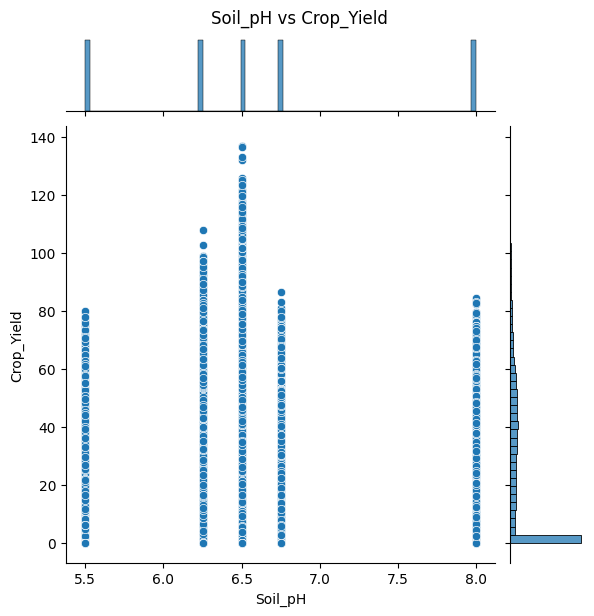

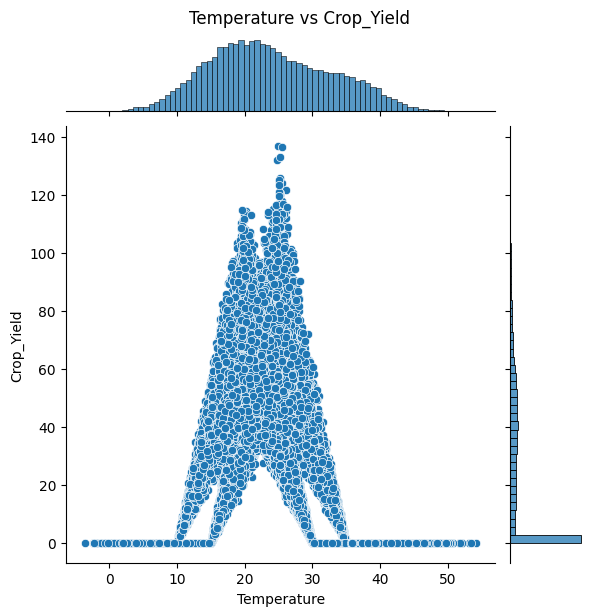

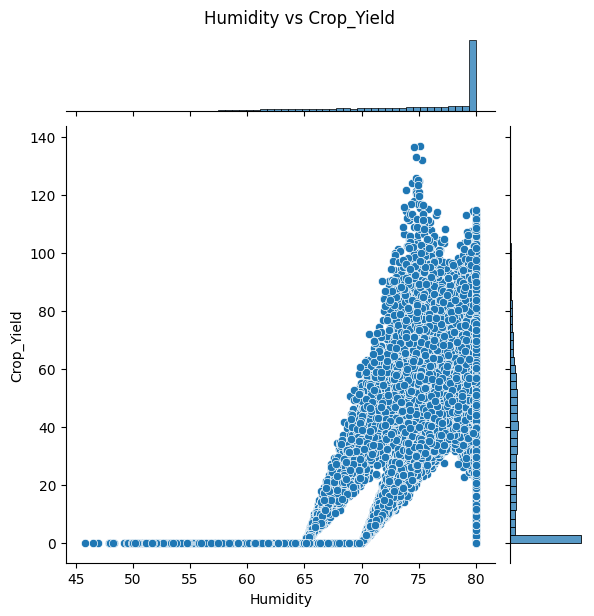

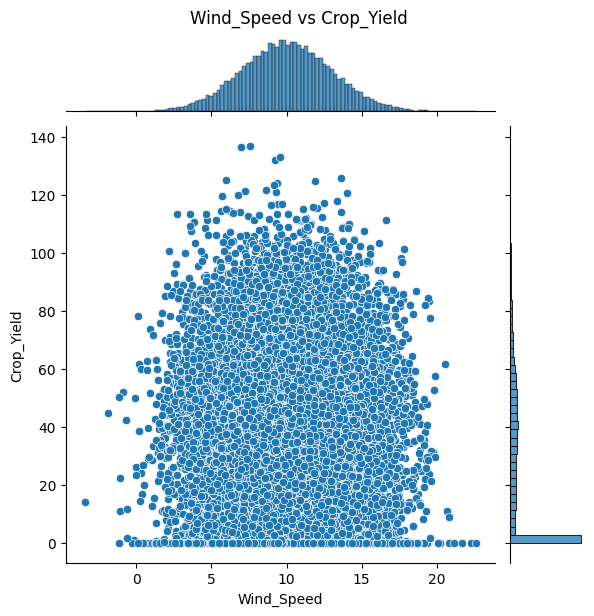

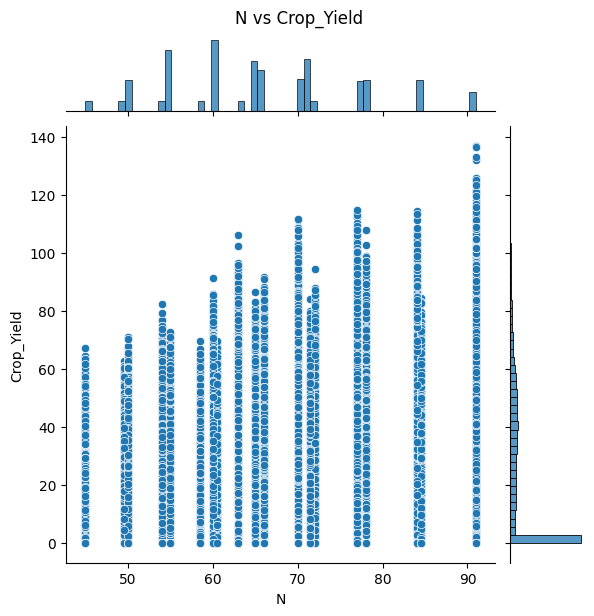

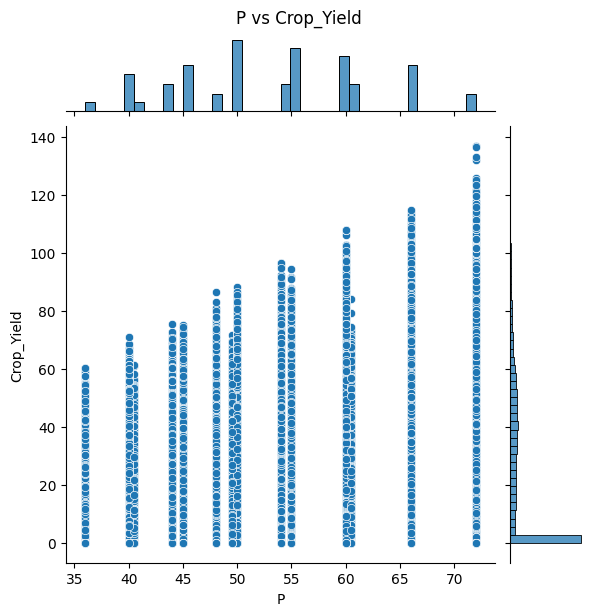

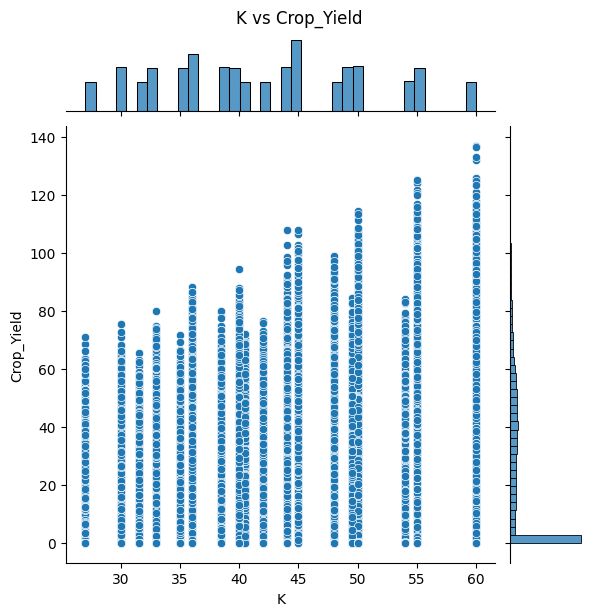

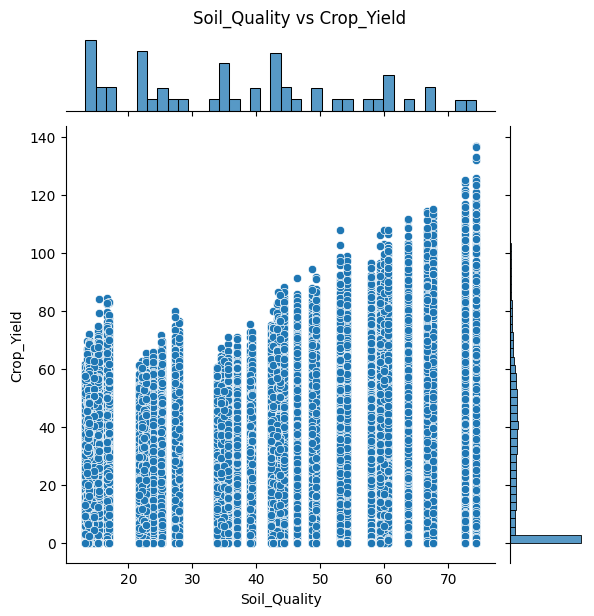

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot each numerical feature against Crop_Yield
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_columns:
    if col != 'Crop_Yield':  # Exclude Crop_Yield vs Crop_Yield
        sns.jointplot(data=df, x=col, y='Crop_Yield', kind='scatter')
        plt.suptitle(f'{col} vs Crop_Yield', y=1.02)  # Title adjustment
        plt.show()

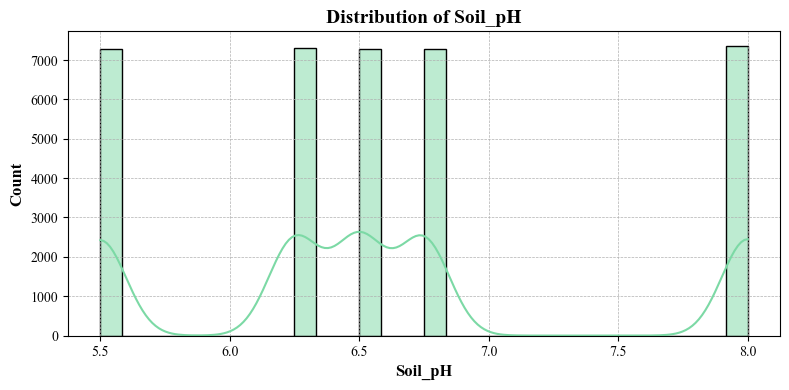

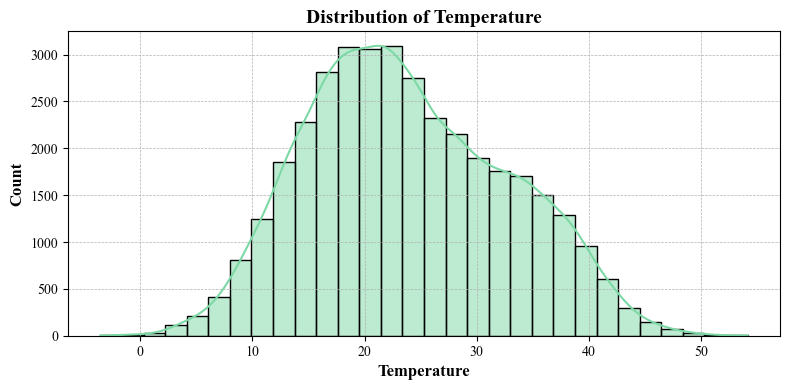

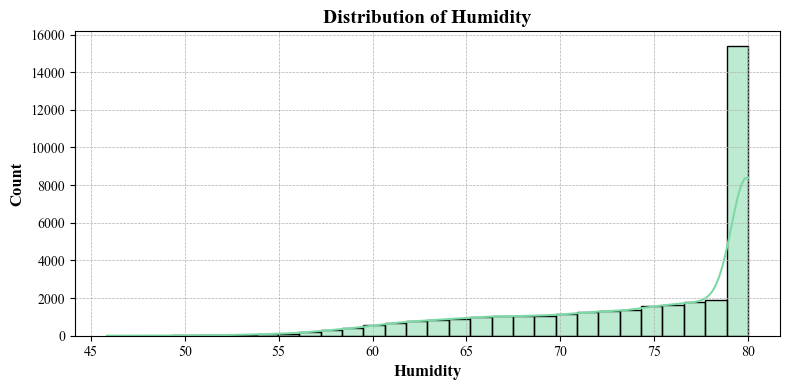

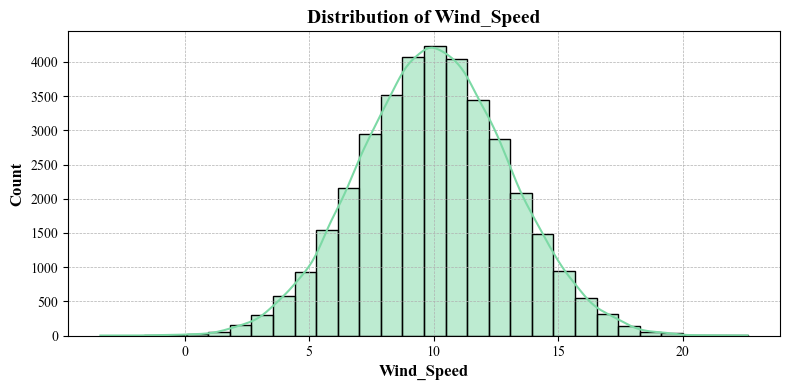

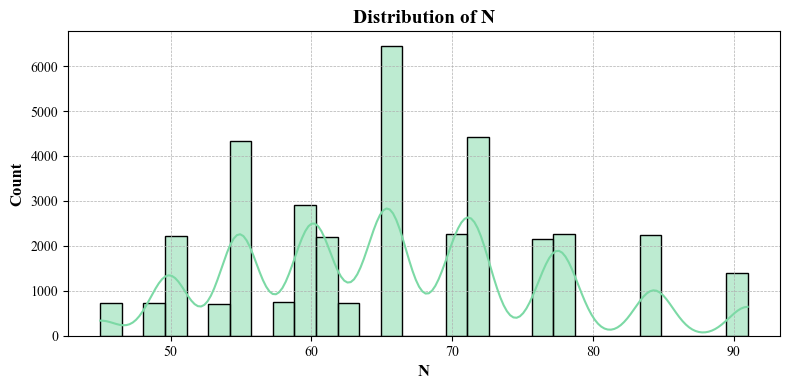

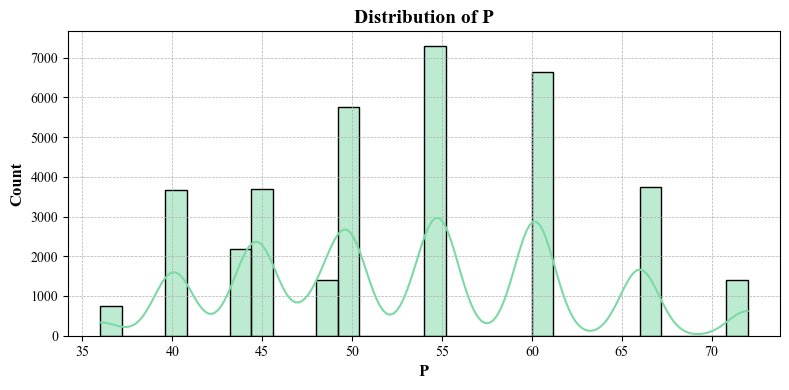

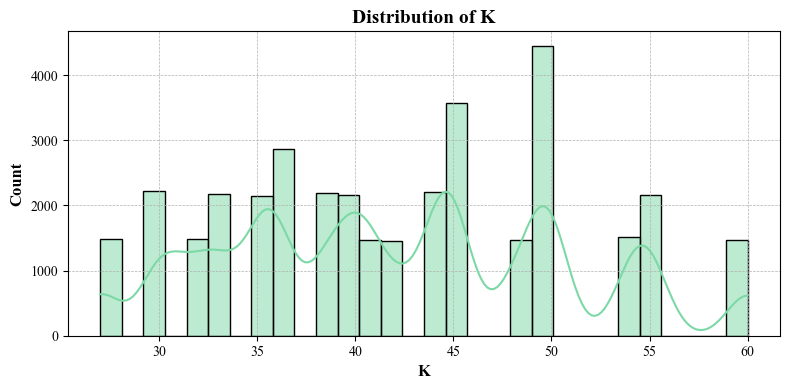

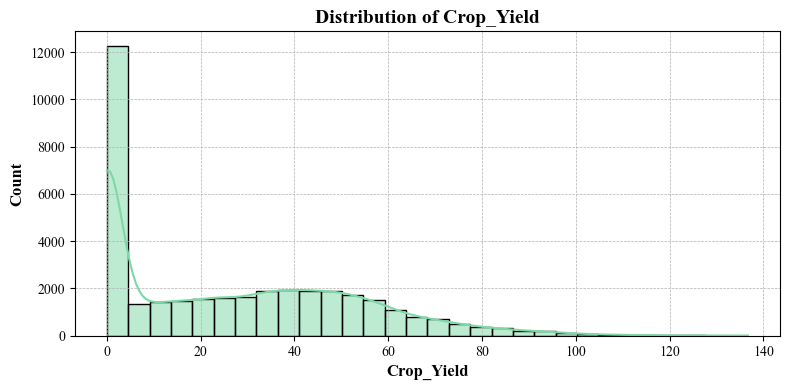

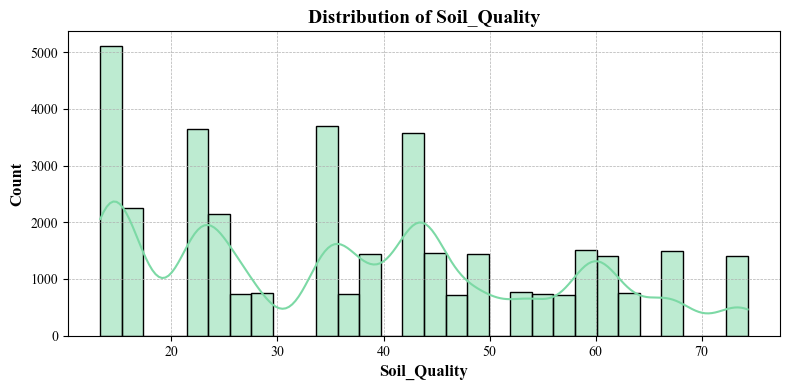

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

# Apply IEEE-style formatting
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10
})

# Plot distribution of each numerical feature
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], kde=True, bins=30, color='#7CD9A5', edgecolor='black')
    plt.title(f'Distribution of {col}', fontweight='bold')
    plt.xlabel(col, fontweight='bold')
    plt.ylabel('Count', fontweight='bold')
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.tight_layout()
    # plt.savefig(f'{col}_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()

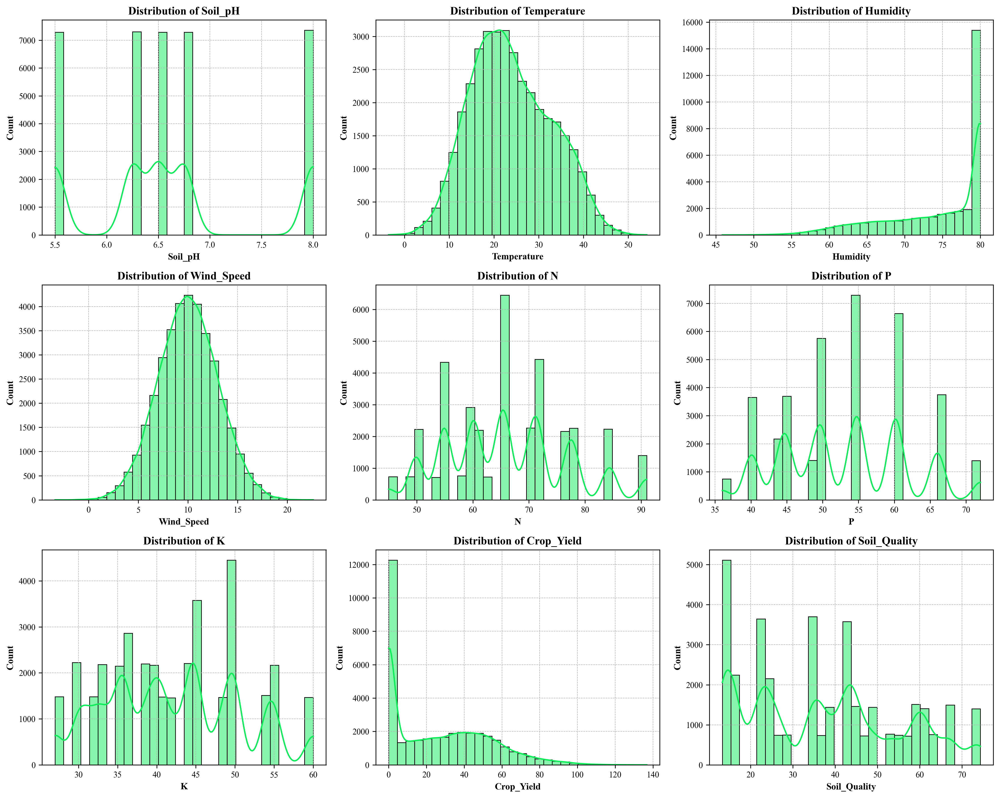

In [18]:
import math

# Filter only numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
n_cols = 3
n_rows = math.ceil(len(numerical_columns) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    ax = axes[i]
    sns.histplot(df[col], kde=True, bins=30, color='#0eed59', edgecolor='black', ax=ax)
    ax.set_title(f'Distribution of {col}', fontsize=12, fontweight='bold')
    ax.set_xlabel(col, fontsize=10, fontweight='bold')
    ax.set_ylabel('Count', fontsize=10, fontweight='bold')
    ax.grid(True, linestyle='--', linewidth=0.5)

# Turn off extra subplots if any
for j in range(len(numerical_columns), len(axes)):
    fig.delaxes(axes[j])

# Layout adjustment and save
plt.tight_layout()
plt.savefig('feature_distributions_grid.png', dpi=300, bbox_inches='tight')
plt.savefig('feature_distributions_grid.pdf', bbox_inches='tight')
plt.show()

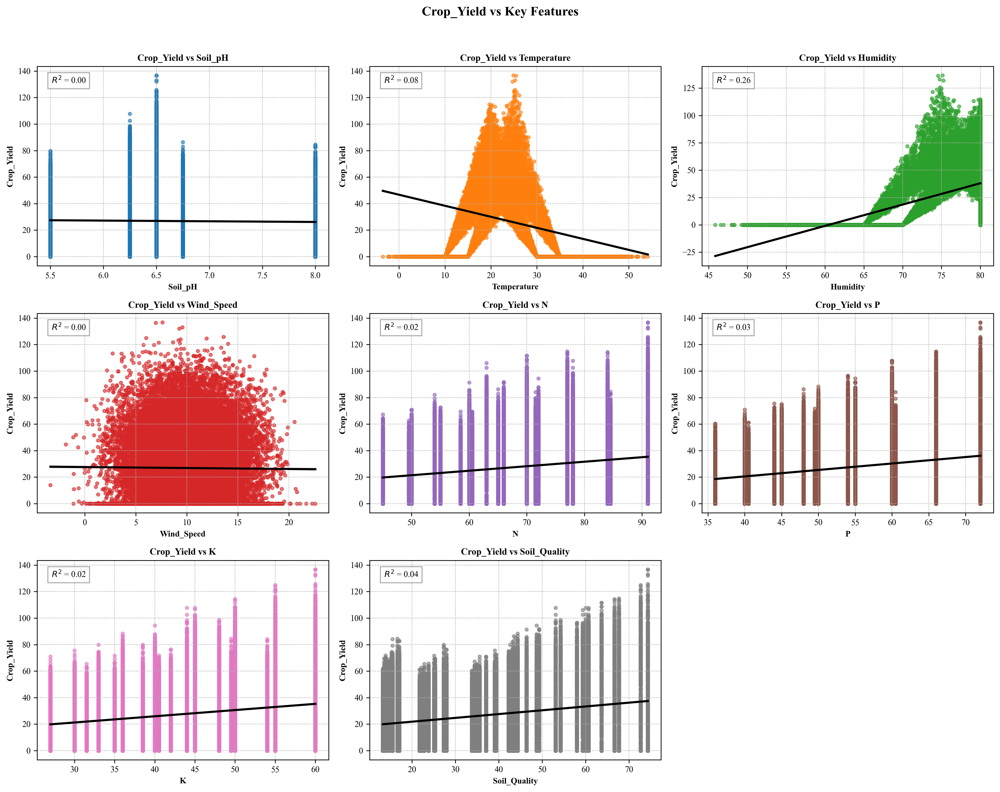

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import linregress

# Sample DataFrame: df
# Target column: 'Crop_Yield'
# Replace this with your actual df and target

# Colors for each plot (12 colors as in your image)
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', 
          '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
          '#bcbd22', '#17becf', '#ffa07a', '#20b2aa']

# Get numerical columns except target
target = 'Crop_Yield'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
features = [col for col in numerical_columns if col != target]

# Setup plot grid
n_cols = 3
n_rows = int(np.ceil(len(features) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

# Apply IEEE style
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 12,
    'axes.titleweight': 'bold',
    'axes.labelsize': 10,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'figure.dpi': 300
})

# Generate scatter plots
for i, feature in enumerate(features):
    ax = axes[i]
    x = df[feature]
    y = df[target]

    # Colored scatter with regression
    sns.regplot(x=x, y=y, ax=ax,
                scatter_kws={'s': 12, 'alpha': 0.6, 'color': colors[i % len(colors)]},
                line_kws={'color': 'black'})

    # R² calculation
    slope, intercept, r_value, _, _ = linregress(x, y)
    r2 = r_value**2
    ax.text(0.05, 0.95, f'$R^2$ = {r2:.2f}', transform=ax.transAxes,
            fontsize=9, verticalalignment='top',
            bbox=dict(facecolor='white', edgecolor='gray', alpha=0.7))

    # Labels and title
    ax.set_title(f'{target} vs {feature}', fontsize=10, fontweight='bold')
    ax.set_xlabel(feature, fontsize=9, fontweight='bold')
    ax.set_ylabel(target, fontsize=9, fontweight='bold')
    ax.grid(True, linestyle='--', linewidth=0.5)

# Remove unused axes
for j in range(len(features), len(axes)):
    fig.delaxes(axes[j])

# Super title
plt.suptitle(f'{target} vs Key Features', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save figures
# plt.savefig(f'{target.lower()}_vs_features.png', dpi=300, bbox_inches='tight')
# plt.savefig(f'{target.lower()}_vs_features.pdf', bbox_inches='tight')
plt.show()


In [5]:
# Display statistics for all numerical columns
statistics = df.describe()

# Show the result
print(statistics)

                      Date       Soil_pH   Temperature      Humidity  \
count                36520  36520.000000  36520.000000  36520.000000   
mean   2018-12-31 12:00:00      6.602731     23.813996     74.256624   
min    2014-01-01 00:00:00      5.500000     -3.540176     45.851089   
25%    2016-07-01 18:00:00      6.250000     17.168542     69.745252   
50%    2018-12-31 12:00:00      6.500000     22.902987     77.097013   
75%    2021-07-01 06:00:00      6.750000     30.254748     80.000000   
max    2023-12-31 00:00:00      8.000000     54.148911     80.000000   
std                    NaN      0.816973      8.920519      6.767587   

         Wind_Speed             N             P            K    Crop_Yield  \
count  36520.000000  36520.000000  36520.000000  36520.00000  36520.000000   
mean      10.020153     66.011035     53.014006     42.01825     26.878480   
min       -3.388906     45.000000     36.000000     27.00000      0.000000   
25%        7.985872     58.500000     4

In [6]:
# Summary for categorical columns
categorical_summary = df.describe(include=['object', 'bool'])
print(categorical_summary)

       Crop_Type_Barley Crop_Type_Corn Crop_Type_Cotton Crop_Type_Potato  \
count             36520          36520            36520            36520   
unique                2              2                2                2   
top               False          False            False            False   
freq              32868          32868            32868            32868   

       Crop_Type_Rice Crop_Type_Soybean Crop_Type_Sugarcane  \
count           36520             36520               36520   
unique              2                 2                   2   
top             False             False               False   
freq            32868             32868               32868   

       Crop_Type_Sunflower Crop_Type_Tomato Crop_Type_Wheat Soil_Type_Clay  \
count                36520            36520           36520          36520   
unique                   2                2               2              2   
top                  False            False           False          

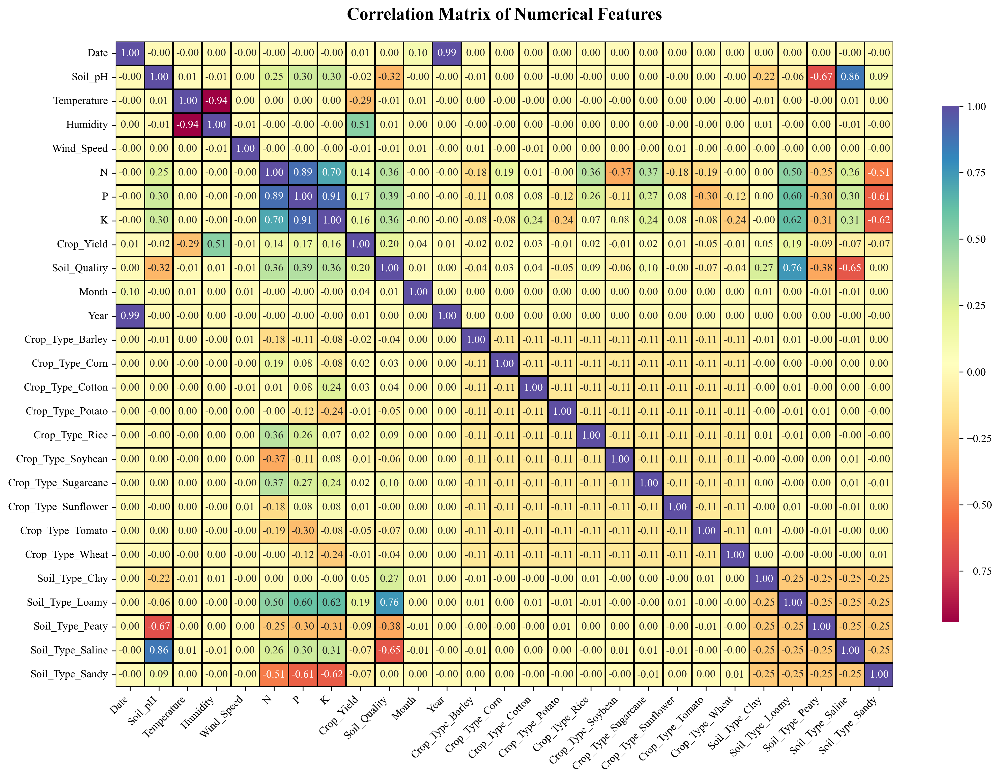

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# IEEE-compliant styling
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10
})

# Compute correlation matrix
correlation_matrix = df.corr()

# Create heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap='Spectral',                 # Vibrant colormap
    linewidths=1,
    linecolor='black',
    cbar_kws={'shrink': 0.8, 'aspect': 30}
)

# Titles and labels
plt.title('Correlation Matrix of Numerical Features', fontsize=16, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Save high-resolution figure
plt.tight_layout()
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.savefig('correlation_heatmap.pdf', bbox_inches='tight')  # For vector format
plt.show()

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


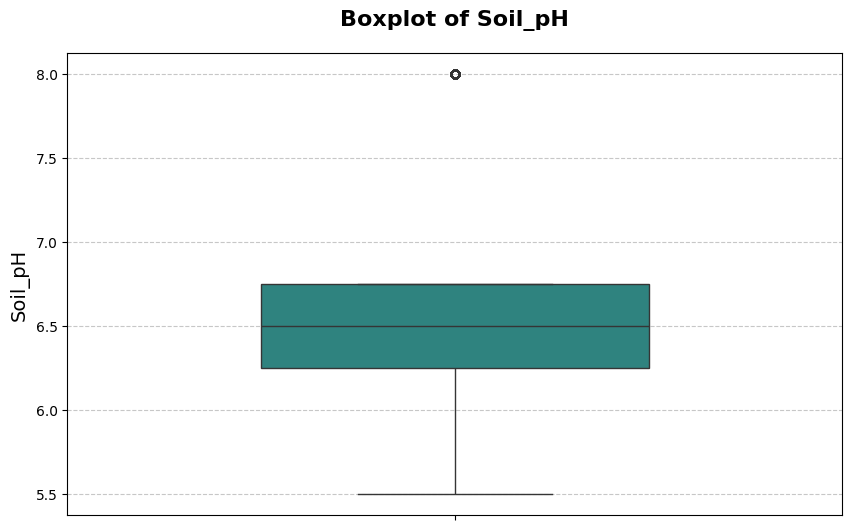

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


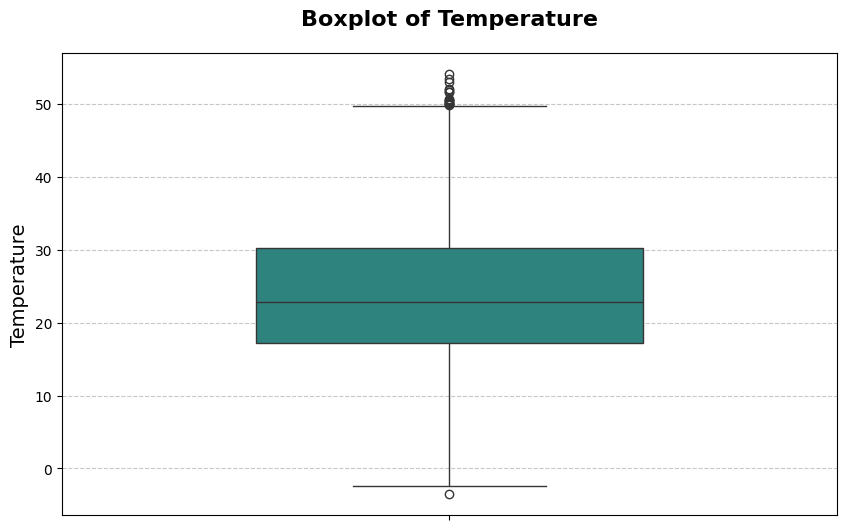

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


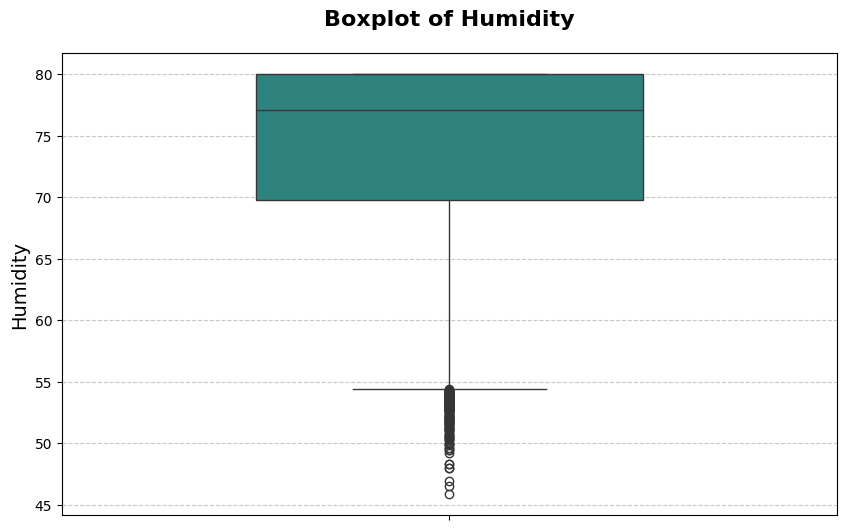

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


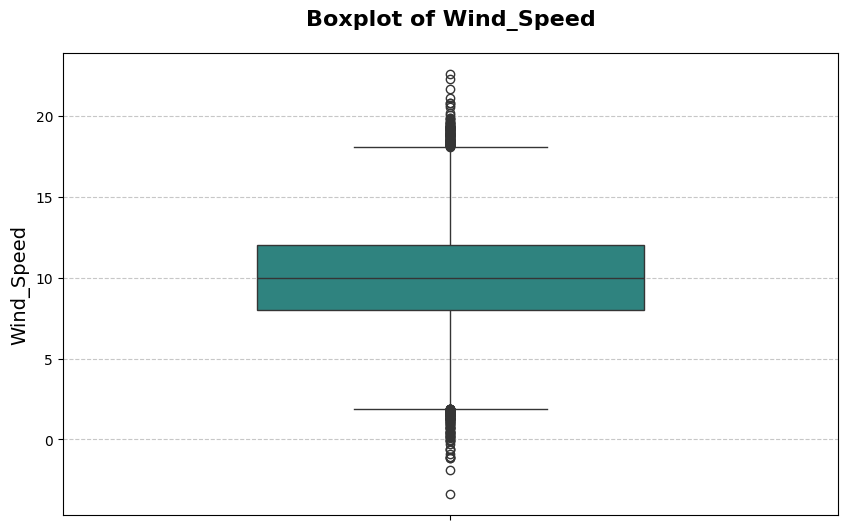

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


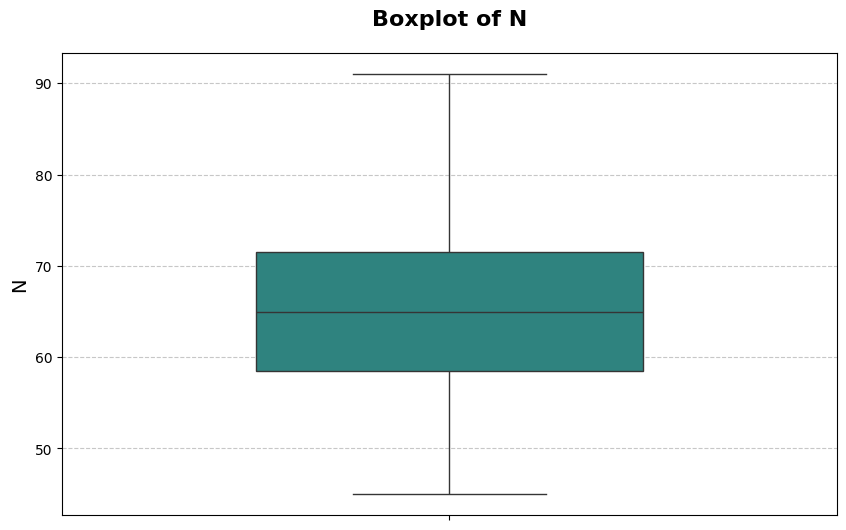

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


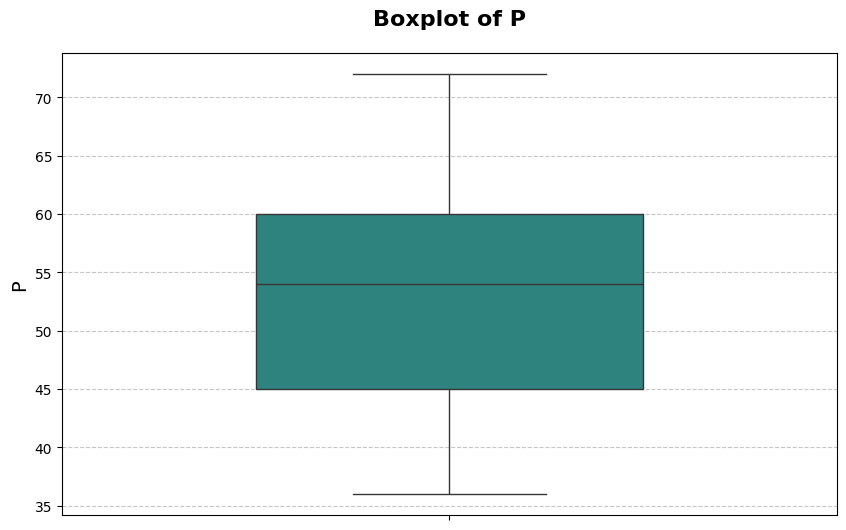

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


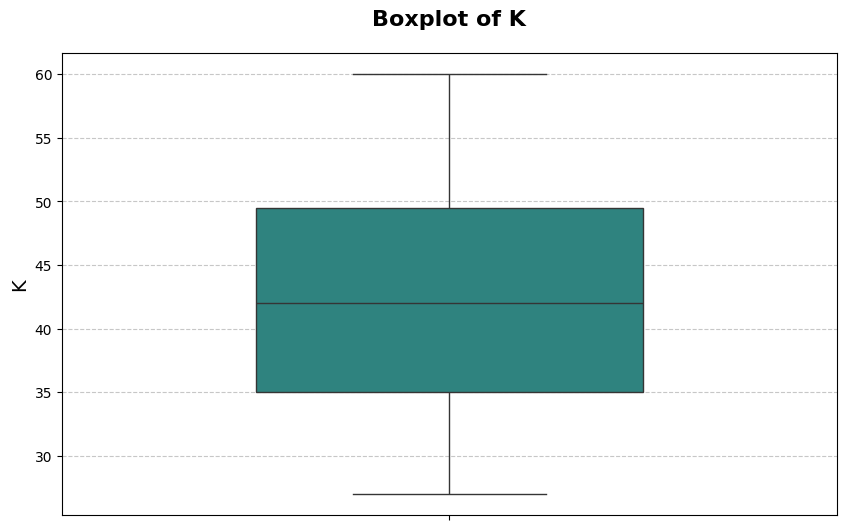

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


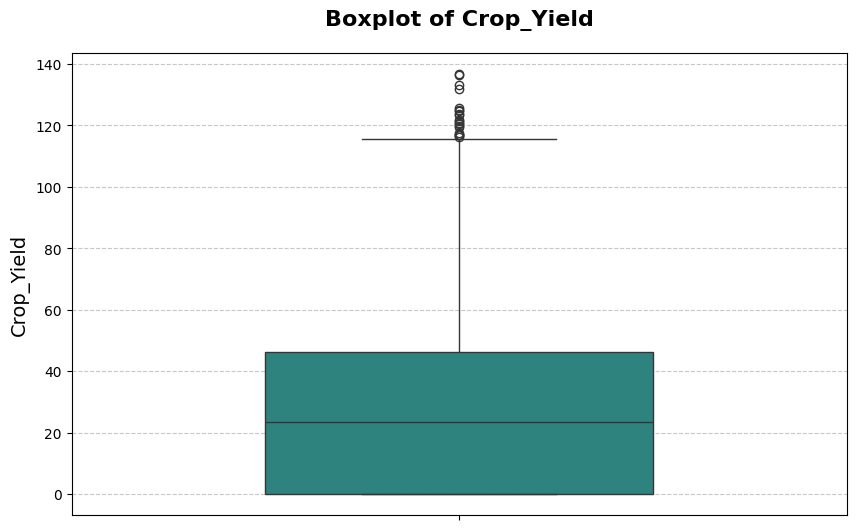

C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_14980\2789856300.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df[col], palette='viridis', width=0.5)


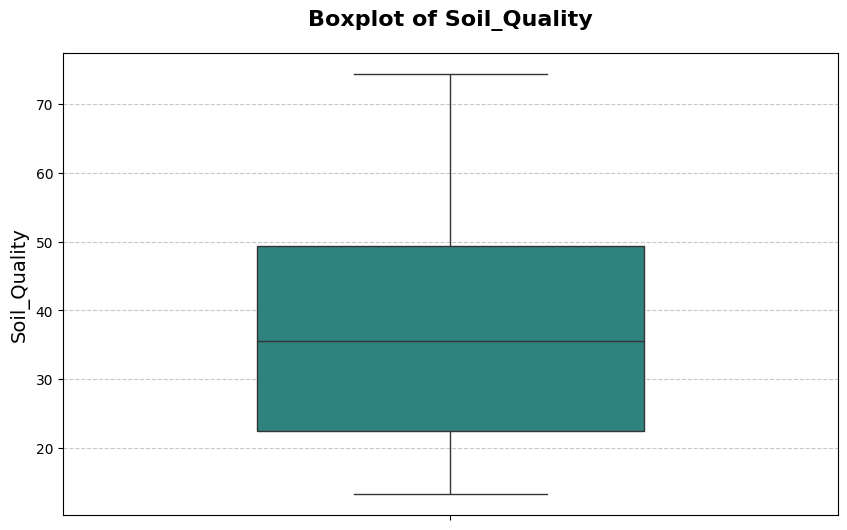

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Plot each numerical column individually
for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(y=df[col], palette='viridis', width=0.5)
    plt.title(f'Boxplot of {col}', fontsize=16, fontweight='bold', pad=20)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.ylabel(col, fontsize=14)
    plt.show()

In [20]:
# Prepare features (X) and target variable (y)
X = df.drop(['Date', 'Crop_Yield'], axis=1)
y = df['Crop_Yield']

# Split data into train, validation, and test sets (70-15-15)
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.176, random_state=42)

# Train Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions on all sets
train_pred = rf_model.predict(X_train)
val_pred = rf_model.predict(X_val)
test_pred = rf_model.predict(X_test)

# Calculate performance metrics for all sets
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return mae, mse, rmse, r2

# Calculate metrics for all sets
train_metrics = calculate_metrics(y_train, train_pred)
val_metrics = calculate_metrics(y_val, val_pred)
test_metrics = calculate_metrics(y_test, test_pred)

# Print results
print("Dataset sizes:")
print("Training set:", X_train.shape[0], "samples")
print("Validation set:", X_val.shape[0], "samples")
print("Test set:", X_test.shape[0], "samples")
print("\
Performance Metrics:")
print("\
Training Set Metrics:")
print("MAE:", train_metrics[0])
print("MSE:", train_metrics[1])
print("RMSE:", train_metrics[2])
print("R-squared:", train_metrics[3])
print("\
Validation Set Metrics:")
print("MAE:", val_metrics[0])
print("MSE:", val_metrics[1])
print("RMSE:", val_metrics[2])
print("R-squared:", val_metrics[3])
print("\
Test Set Metrics:")
print("MAE:", test_metrics[0])
print("MSE:", test_metrics[1])
print("RMSE:", test_metrics[2])
print("R-squared:", test_metrics[3])

Dataset sizes:
Training set: 25578 samples
Validation set: 5464 samples
Test set: 5478 samples
Performance Metrics:
Training Set Metrics:
MAE: 0.8556408547705363
MSE: 2.1813629499945346
RMSE: 1.4769437870124018
R-squared: 0.9967052259047229
Validation Set Metrics:
MAE: 2.292295435240933
MSE: 15.932434665811142
RMSE: 3.991545398189922
R-squared: 0.9759874875831597
Test Set Metrics:
MAE: 2.3495646225811284
MSE: 16.359122389841293
RMSE: 4.044641194202681
R-squared: 0.9753576786987859


In [21]:
# Import AdaBoostRegressor
from sklearn.ensemble import AdaBoostRegressor

# Train AdaBoost model
ada_model = AdaBoostRegressor(n_estimators=100, random_state=42)
ada_model.fit(X_train, y_train)

# Make predictions on all sets
train_pred_ada = ada_model.predict(X_train)
val_pred_ada = ada_model.predict(X_val)
test_pred_ada = ada_model.predict(X_test)

# Calculate performance metrics for all sets using the same function
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return mae, mse, rmse, r2

# Calculate metrics for all sets
train_metrics_ada = calculate_metrics(y_train, train_pred_ada)
val_metrics_ada = calculate_metrics(y_val, val_pred_ada)
test_metrics_ada = calculate_metrics(y_test, test_pred_ada)

# Print results
print("\
Performance Metrics for AdaBoost:")
print("\
Training Set Metrics:")
print("MAE:", train_metrics_ada[0])
print("MSE:", train_metrics_ada[1])
print("RMSE:", train_metrics_ada[2])
print("R-squared:", train_metrics_ada[3])
print("\
Validation Set Metrics:")
print("MAE:", val_metrics_ada[0])
print("MSE:", val_metrics_ada[1])
print("RMSE:", val_metrics_ada[2])
print("R-squared:", val_metrics_ada[3])
print("\
Test Set Metrics:")
print("MAE:", test_metrics_ada[0])
print("MSE:", test_metrics_ada[1])
print("RMSE:", test_metrics_ada[2])
print("R-squared:", test_metrics_ada[3])

Performance Metrics for AdaBoost:
Training Set Metrics:
MAE: 12.613007422199235
MSE: 198.406453985914
RMSE: 14.085682588568933
R-squared: 0.700322935745191
Validation Set Metrics:
MAE: 12.716829933296621
MSE: 200.76816914935353
RMSE: 14.169268476154777
R-squared: 0.6974129657063495
Test Set Metrics:
MAE: 12.594632392549926
MSE: 196.7909387234556
RMSE: 14.028219371091101
R-squared: 0.7035668891258908


In [22]:
# Import XGBoost library
from xgboost import XGBRegressor

# Train XGBoost model
xgb_model = XGBRegressor(n_estimators=100, random_state=42)
xgb_model.fit(X_train, y_train)

# Make predictions on all sets
train_pred_xgb = xgb_model.predict(X_train)
val_pred_xgb = xgb_model.predict(X_val)
test_pred_xgb = xgb_model.predict(X_test)

# Calculate performance metrics for all sets using the same function
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return mae, mse, rmse, r2

# Calculate metrics for all sets
train_metrics_xgb = calculate_metrics(y_train, train_pred_xgb)
val_metrics_xgb = calculate_metrics(y_val, val_pred_xgb)
test_metrics_xgb = calculate_metrics(y_test, test_pred_xgb)

# Print results
print("\
Performance Metrics for XGBoost:")
print("\
Training Set Metrics:")
print("MAE:", train_metrics_xgb[0])
print("MSE:", train_metrics_xgb[1])
print("RMSE:", train_metrics_xgb[2])
print("R-squared:", train_metrics_xgb[3])
print("\
Validation Set Metrics:")
print("MAE:", val_metrics_xgb[0])
print("MSE:", val_metrics_xgb[1])
print("RMSE:", val_metrics_xgb[2])
print("R-squared:", val_metrics_xgb[3])
print("\
Test Set Metrics:")
print("MAE:", test_metrics_xgb[0])
print("MSE:", test_metrics_xgb[1])
print("RMSE:", test_metrics_xgb[2])
print("R-squared:", test_metrics_xgb[3])

Performance Metrics for XGBoost:
Training Set Metrics:
MAE: 1.887715807701917
MSE: 8.892355359049992
RMSE: 2.982005258052036
R-squared: 0.9865688091552717
Validation Set Metrics:
MAE: 2.477111670860533
MSE: 16.229653928093068
RMSE: 4.0286044640908925
R-squared: 0.9755395346258264
Test Set Metrics:
MAE: 2.525468434094341
MSE: 16.595212843322848
RMSE: 4.073722234434111
R-squared: 0.9750020473469198


In [23]:
# Import LightGBM library
from lightgbm import LGBMRegressor

# Train LightGBM model
lgbm_model = LGBMRegressor(n_estimators=100, random_state=42)
lgbm_model.fit(X_train, y_train)

# print("LightGBM model training complete.")
# Make predictions and calculate metrics for LightGBM
train_pred_lgbm = lgbm_model.predict(X_train)
val_pred_lgbm = lgbm_model.predict(X_val)
test_pred_lgbm = lgbm_model.predict(X_test)

# Calculate metrics for all sets
train_metrics_lgbm = calculate_metrics(y_train, train_pred_lgbm)
val_metrics_lgbm = calculate_metrics(y_val, val_pred_lgbm)
test_metrics_lgbm = calculate_metrics(y_test, test_pred_lgbm)

# Print results
print("\
Performance Metrics for LightGBM:")
print("\
Training Set Metrics:")
print("MAE:", train_metrics_lgbm[0])
print("MSE:", train_metrics_lgbm[1])
print("RMSE:", train_metrics_lgbm[2])
print("R-squared:", train_metrics_lgbm[3])
print("\
Validation Set Metrics:")
print("MAE:", val_metrics_lgbm[0])
print("MSE:", val_metrics_lgbm[1])
print("RMSE:", val_metrics_lgbm[2])
print("R-squared:", val_metrics_lgbm[3])
print("\
Test Set Metrics:")
print("MAE:", test_metrics_lgbm[0])
print("MSE:", test_metrics_lgbm[1])
print("RMSE:", test_metrics_lgbm[2])
print("R-squared:", test_metrics_lgbm[3])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 925
[LightGBM] [Info] Number of data points in the train set: 25578, number of used features: 25
[LightGBM] [Info] Start training from score 26.962468
Performance Metrics for LightGBM:
Training Set Metrics:
MAE: 2.2473577471672574
MSE: 12.81298602453681
RMSE: 3.579523156027463
R-squared: 0.9806470104221323
Validation Set Metrics:
MAE: 2.422156996249959
MSE: 15.462136989644728
RMSE: 3.9321923897038316
R-squared: 0.9766962950583155
Test Set Metrics:
MAE: 2.420375157809046
MSE: 15.122802250700508
RMSE: 3.8888047329096516
R-squared: 0.9772199911978223


In [24]:
# !pip install catboost
# Import CatBoost library
from catboost import CatBoostRegressor

# Train CatBoost model
catboost_model = CatBoostRegressor(iterations=200, random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)

# print("CatBoost model training complete.")
# Make predictions and calculate metrics for CatBoost
train_pred_catboost = catboost_model.predict(X_train)
val_pred_catboost = catboost_model.predict(X_val)
test_pred_catboost = catboost_model.predict(X_test)

# Calculate metrics for all sets
train_metrics_catboost = calculate_metrics(y_train, train_pred_catboost)
val_metrics_catboost = calculate_metrics(y_val, val_pred_catboost)
test_metrics_catboost = calculate_metrics(y_test, test_pred_catboost)

# Print results
print("\
Performance Metrics for CatBoost:")
print("\
Training Set Metrics:")
print("MAE:", train_metrics_catboost[0])
print("MSE:", train_metrics_catboost[1])
print("RMSE:", train_metrics_catboost[2])
print("R-squared:", train_metrics_catboost[3])
print("\
Validation Set Metrics:")
print("MAE:", val_metrics_catboost[0])
print("MSE:", val_metrics_catboost[1])
print("RMSE:", val_metrics_catboost[2])
print("R-squared:", val_metrics_catboost[3])
print("\
Test Set Metrics:")
print("MAE:", test_metrics_catboost[0])
print("MSE:", test_metrics_catboost[1])
print("RMSE:", test_metrics_catboost[2])
print("R-squared:", test_metrics_catboost[3])

Performance Metrics for CatBoost:
Training Set Metrics:
MAE: 2.2411755585447093
MSE: 12.460219284556763
RMSE: 3.52990358006515
R-squared: 0.9811798363402421
Validation Set Metrics:
MAE: 2.4323811499963766
MSE: 15.224774011611743
RMSE: 3.9018936443234513
R-squared: 0.9770540358290682
Test Set Metrics:
MAE: 2.457977104710407
MSE: 15.201532174547758
RMSE: 3.8989142302117594
R-squared: 0.9771013975451048


In [26]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from datetime import datetime

# Load the dataset
df = pd.read_csv('crop_yield_dataset.csv')

# Convert date to numerical feature (days since earliest date)
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')
df['Days'] = (df['Date'] - df['Date'].min()).dt.days
df = df.drop('Date', axis=1)

# Encode categorical variables
le = LabelEncoder()
df['Crop_Type'] = le.fit_transform(df['Crop_Type'])
df['Soil_Type'] = le.fit_transform(df['Soil_Type'])

# Separate features and target
X = df.drop('Crop_Yield', axis=1)
y = df['Crop_Yield']

# First split: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)

# Second split: Split the temp into validation and test (50% each, which is 15% of original data)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Convert to DataFrame to preserve column names
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_val_scaled = pd.DataFrame(X_val_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_train.columns)

print("Dataset shapes:")
print("Training set:", X_train_scaled.shape)
print("Validation set:", X_val_scaled.shape)
print("Test set:", X_test_scaled.shape)

# Function to evaluate models
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\
Performance metrics for {dataset_name}:")
    print(f"MAE: {mae:.4f}")
    print(f"MSE: {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R2 Score: {r2:.4f}")
    
    return mae, mse, rmse, r2

Dataset shapes:
Training set: (25564, 11)
Validation set: (5478, 11)
Test set: (5478, 11)


In [27]:
# Import necessary libraries for hyperparameter tuning
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Define parameter grid for Random Forest
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

# Initialize Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Set up GridSearchCV
rf_grid_search = GridSearchCV(estimator=rf_model, param_grid=rf_param_grid, cv=3, n_jobs=-1, scoring='neg_mean_squared_error')

# Perform grid search
rf_grid_search.fit(X_train_scaled, y_train)

# Best parameters and performance
best_rf_params = rf_grid_search.best_params_
rf_best_model = rf_grid_search.best_estimator_

# Evaluate on validation set
y_val_pred = rf_best_model.predict(X_val_scaled)
rf_val_metrics = evaluate_model(y_val, y_val_pred, "Validation Set")

# Evaluate on test set
y_test_pred = rf_best_model.predict(X_test_scaled)
rf_test_metrics = evaluate_model(y_test, y_test_pred, "Test Set")

print("Best Random Forest Parameters:", best_rf_params)
print("\nValidation Set Metrics:", rf_val_metrics)
print("\nTest Set Metrics:", rf_test_metrics)

Performance metrics for Validation Set:
MAE: 2.3109
MSE: 15.4571
RMSE: 3.9316
R2 Score: 0.9769
Performance metrics for Test Set:
MAE: 2.2859
MSE: 15.3274
RMSE: 3.9150
R2 Score: 0.9768
Best Random Forest Parameters: {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 300}

Validation Set Metrics: (2.3109347623754353, 15.457124122072134, 3.9315549242090126, 0.9769003125917886)

Test Set Metrics: (2.285883418901037, 15.327430437118004, 3.9150262370919053, 0.9768151387915113)


In [28]:
print(f"Length of y_test: {len(y_test)}")
print(f"Length of y_test_pred: {len(y_test_pred)}")

Length of y_test: 5478
Length of y_test_pred: 5478


In [29]:
print(y_test.shape)
print(y_test_pred.shape) 

(5478,)
(5478,)


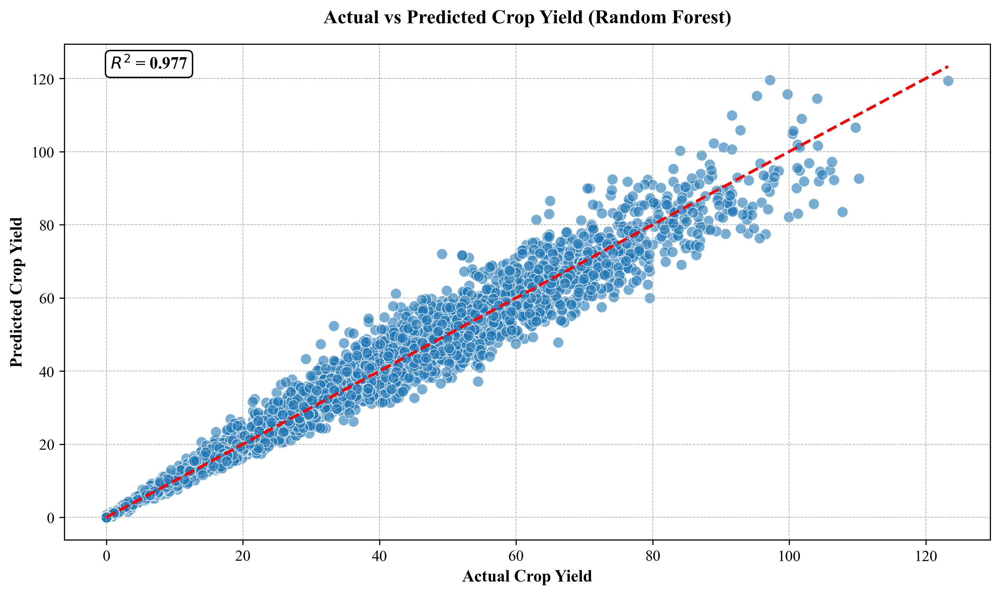

Residuals:
 count    5478.000000
mean       -0.039268
std         3.915187
min       -22.854991
25%        -0.909491
50%         0.000000
75%         0.938640
max        24.263238
Name: Residuals, dtype: float64


In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import r2_score

# Create DataFrame for visualization
results_df_rf = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred
})
results_df_rf['Residuals'] = results_df_rf['Actual'] - results_df_rf['Predicted']

# Calculate R² score
r2 = r2_score(results_df_rf['Actual'], results_df_rf['Predicted'])

# Apply IEEE-style formatting
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 11,
    'ytick.labelsize': 11
})

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=results_df_rf, x='Actual', y='Predicted',
    color='#1f77b4', alpha=0.6, s=60
)

# 45-degree line
plt.plot(
    [results_df_rf['Actual'].min(), results_df_rf['Actual'].max()],
    [results_df_rf['Actual'].min(), results_df_rf['Actual'].max()],
    color='red', linestyle='--', linewidth=2, label='Ideal Fit'
)

# Annotate R² on plot
plt.text(
    0.05, 0.95, f'$R^2$ = {r2:.3f}',
    transform=plt.gca().transAxes,
    fontsize=12,
    fontweight='bold',
         bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='black')
)

# Titles and labels
plt.title('Actual vs Predicted Crop Yield (Random Forest)', pad=15)
plt.xlabel('Actual Crop Yield')
plt.ylabel('Predicted Crop Yield')
plt.grid(True, linestyle='--', linewidth=0.5)

# Save and show
plt.tight_layout()
plt.savefig('actual_vs_predicted_rf.png', dpi=300, bbox_inches='tight')
plt.savefig('actual_vs_predicted_rf.pdf', bbox_inches='tight')
plt.show()

# Optional: Residual summary
print("Residuals:\n", results_df_rf['Residuals'].describe())

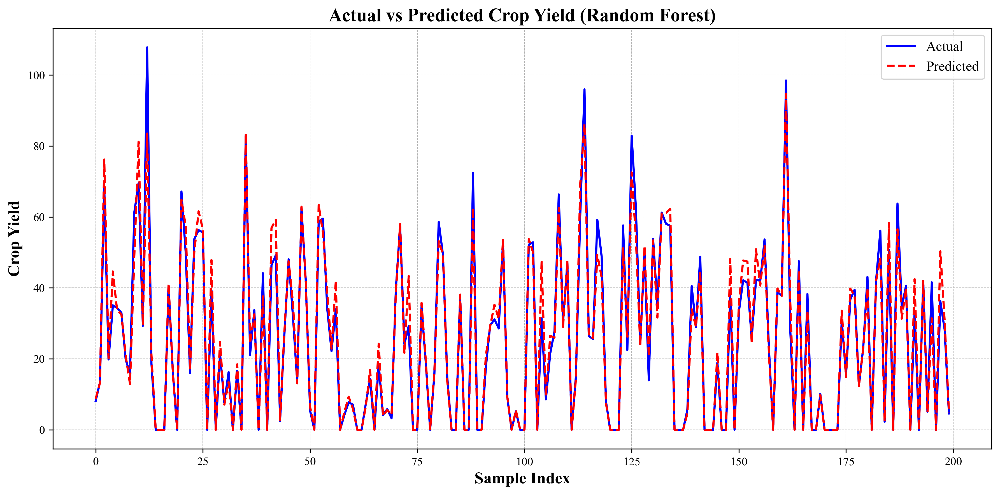

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create DataFrame from actual and predicted values
results_df_rf = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred
})

# Take a random sample of 200 data points
results_df_sampled = results_df_rf.sample(n=200, random_state=42).sort_index()

# Set IEEE-style font
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10
})

# Plot
plt.figure(figsize=(12, 6))
plt.plot(results_df_sampled['Actual'].reset_index(drop=True), label='Actual', color='blue', linestyle='-', linewidth=1.8)
plt.plot(results_df_sampled['Predicted'].reset_index(drop=True), label='Predicted', color='red', linestyle='--', linewidth=1.8)

# Labels and formatting
plt.title('Actual vs Predicted Crop Yield (Random Forest)', fontsize=16, fontweight='bold')
plt.xlabel('Sample Index', fontsize=14, fontweight='bold')
plt.ylabel('Crop Yield', fontsize=14, fontweight='bold')
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.5)

# Save high-resolution figure
plt.tight_layout()
plt.savefig('T-3.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-3.pdf', bbox_inches='tight')  # optional for IEEE vector use
plt.show()

In [34]:
print(results_df_rf.shape)
print(results_df_rf.head())

(5478, 2)
          Actual  Predicted
12286  39.875906  38.431884
13020   0.000000   0.000000
23511  13.984557  13.039379
25415  38.855743  41.800486
3570    0.000000   0.000000


In [44]:
import xgboost
import sklearn

print("XGBoost version:", xgboost.__version__)
print("Scikit-learn version:", sklearn.__version__)

XGBoost version: 2.1.2
Scikit-learn version: 1.6.1


In [48]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from itertools import product

# Define parameter grid
xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}

# Track best score
best_score = float('inf')
best_model = None
best_params = None

# Manual grid search
for n, d, lr, ss in product(
    xgb_param_grid['n_estimators'],
    xgb_param_grid['max_depth'],
    xgb_param_grid['learning_rate'],
    xgb_param_grid['subsample']
):
    model = XGBRegressor(
        n_estimators=n,
        max_depth=d,
        learning_rate=lr,
        subsample=ss,
        objective='reg:squarederror',
        random_state=42,
        verbosity=0
    )
    model.fit(X_train_scaled, y_train)
    y_val_pred = model.predict(X_val_scaled)
    mse = mean_squared_error(y_val, y_val_pred)
    
    if mse < best_score:
        best_score = mse
        best_model = model
        best_params = {
            'n_estimators': n,
            'max_depth': d,
            'learning_rate': lr,
            'subsample': ss
        }

# Use best model
y_test_pred_xgb = best_model.predict(X_test_scaled)

# Evaluate
xgb_val_metrics = evaluate_model(y_val, best_model.predict(X_val_scaled), "Validation Set")
xgb_test_metrics = evaluate_model(y_test, y_test_pred_xgb, "Test Set")

# Output
print("Best XGBoost Parameters:", best_params)
print("\nValidation Set Metrics:", xgb_val_metrics)
print("\nTest Set Metrics:", xgb_test_metrics)

Performance metrics for Validation Set:
MAE: 2.3810
MSE: 15.7909
RMSE: 3.9738
R2 Score: 0.9764
Performance metrics for Test Set:
MAE: 2.3529
MSE: 15.6455
RMSE: 3.9554
R2 Score: 0.9763
Best XGBoost Parameters: {'n_estimators': 100, 'max_depth': 10, 'learning_rate': 0.1, 'subsample': 1.0}

Validation Set Metrics: (2.3810247196279075, 15.7908927525195, 3.973775629363024, 0.9764015166340728)

Test Set Metrics: (2.3528659127829954, 15.645545472860698, 3.95544504106184, 0.9763339457446868)


In [49]:
print(f"Length of y_test: {len(y_test)}")
print(f"Length of y_test_pred: {len(y_test_pred_xgb)}")
print(y_test.shape)
print(y_test_pred_xgb.shape) 

Length of y_test: 5478
Length of y_test_pred: 5478
(5478,)
(5478,)


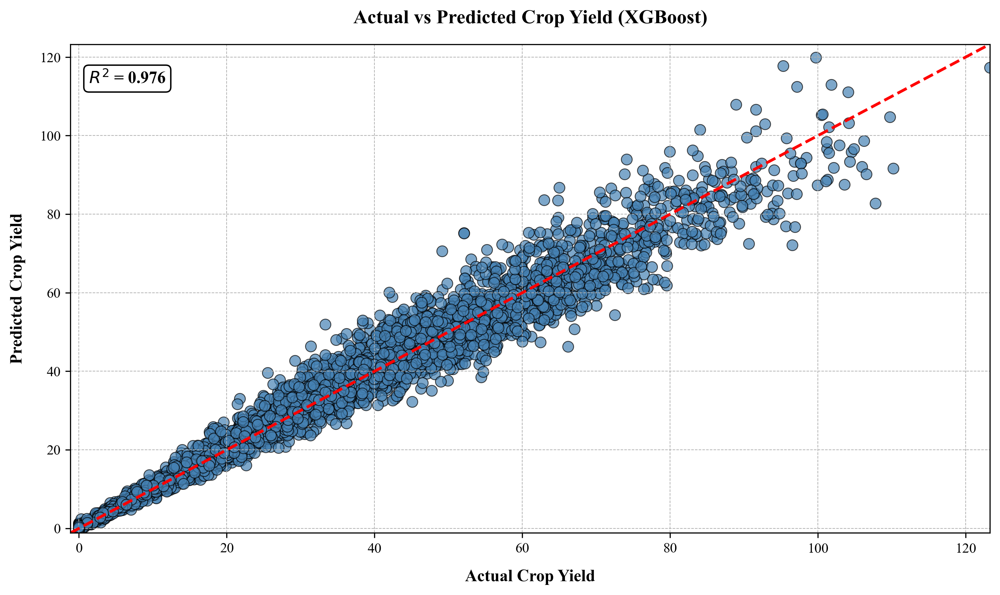

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import r2_score

# Create DataFrame with predictions
results_df_xgb = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_xgb
})

# Calculate R²
r2 = r2_score(results_df_xgb['Actual'], results_df_xgb['Predicted'])

# Apply IEEE-compliant styles
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Create the plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=results_df_xgb,
    x='Actual',
    y='Predicted',
    color='steelblue',
    s=60,
    alpha=0.7,
    edgecolor='black'
)

# Add dashed red 1:1 line
min_val = min(results_df_xgb['Actual'].min(), results_df_xgb['Predicted'].min())
max_val = max(results_df_xgb['Actual'].max(), results_df_xgb['Predicted'].max())
plt.plot([min_val, max_val], [min_val, max_val],
         linestyle='--', color='red', linewidth=2, label='Ideal Fit')

# Labels and Title
plt.title('Actual vs Predicted Crop Yield (XGBoost)', pad=15)
plt.xlabel('Actual Crop Yield', labelpad=10)
plt.ylabel('Predicted Crop Yield', labelpad=10)

# R² Annotation
plt.text(min_val + 0.02 * (max_val - min_val),
         max_val - 0.08 * (max_val - min_val),
         f"$R^2$ = {r2:.3f}",
         fontsize=12,
         fontweight='bold',
         bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='black'))

# Grid and limits
plt.grid(True, linestyle='--', linewidth=0.5)
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

# Save high-resolution image
plt.tight_layout()
plt.savefig('XGBoost_Actual_vs_Predicted.png', dpi=300, bbox_inches='tight')
plt.savefig('XGBoost_Actual_vs_Predicted.pdf', bbox_inches='tight')
plt.show()

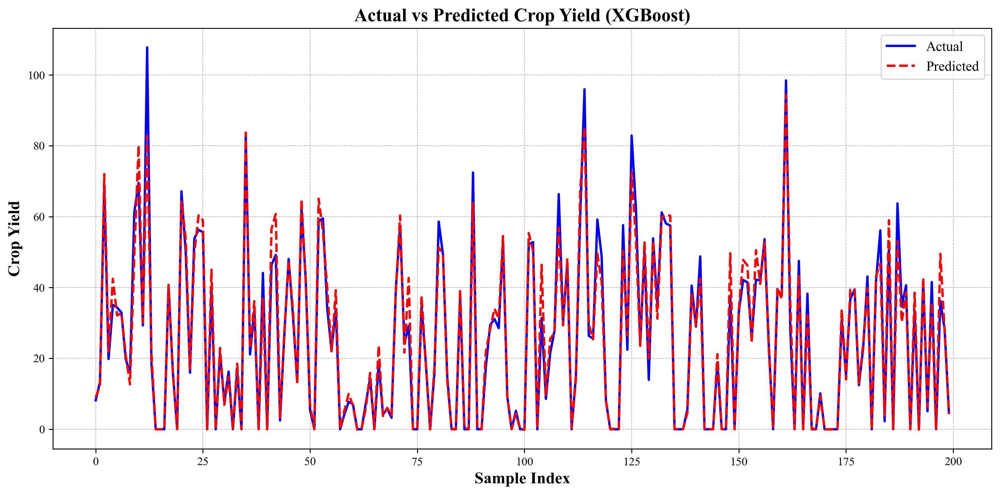

Residuals for Random Sample:
 count    200.000000
mean      -0.258806
std        4.453200
min      -15.016914
25%       -1.684506
50%       -0.045185
75%        0.725864
max       24.998529
Name: Residuals, dtype: float64


In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create DataFrame
results_df_xgb = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_xgb
})
results_df_xgb['Residuals'] = results_df_xgb['Actual'] - results_df_xgb['Predicted']

# Sample 200 points for clarity
results_df_xgb_sampled = results_df_xgb.sample(n=200, random_state=42).sort_index()

# IEEE-style plot settings
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Line plot
plt.figure(figsize=(12, 6))
plt.plot(results_df_xgb_sampled['Actual'].reset_index(drop=True), 
         label='Actual', color='blue', linestyle='-', linewidth=2)
plt.plot(results_df_xgb_sampled['Predicted'].reset_index(drop=True), 
         label='Predicted', color='red', linestyle='--', linewidth=2)

# Labels and title
# Labels and formatting
plt.title('Actual vs Predicted Crop Yield (XGBoost)', fontsize=16, fontweight='bold')
plt.xlabel('Sample Index', fontsize=14, fontweight='bold')
plt.ylabel('Crop Yield', fontsize=14, fontweight='bold')
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.5)

# Save and show
plt.tight_layout()
plt.savefig('T-5.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-5.pdf', bbox_inches='tight')
plt.show()

# Optional: Residual analysis
print("Residuals for Random Sample:\n", results_df_xgb_sampled['Residuals'].describe())

In [62]:
print(f"Length of y_test: {len(y_test)}")
print(f"Length of y_test_pred: {len(y_test_pred_lgb)}")
print(y_test.shape)
print(y_test_pred_lgb.shape) 

Length of y_test: 5478
Length of y_test_pred: 5478
(5478,)
(5478,)


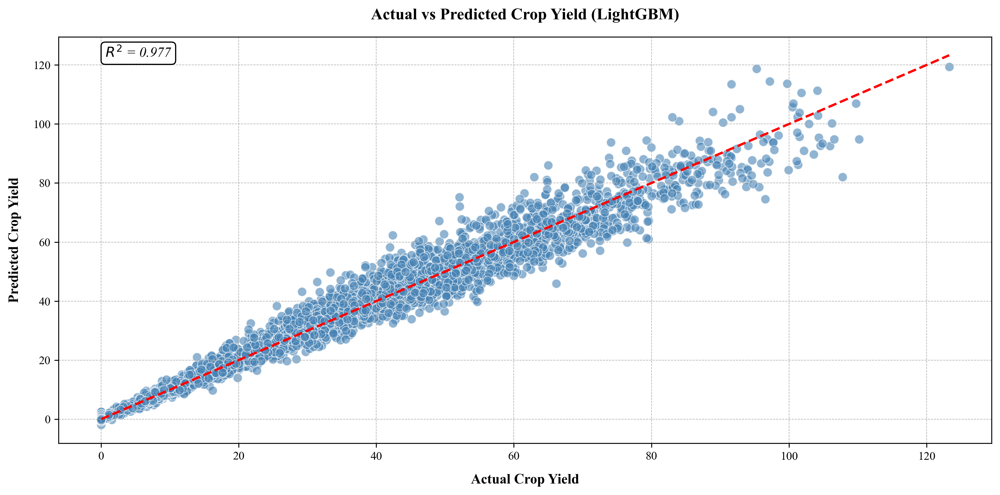

Residuals:
 count    5478.000000
mean       -0.056448
std         3.858959
min       -23.411073
25%        -1.062299
50%        -0.006677
75%         1.078590
max        25.733578
Name: Residuals, dtype: float64


In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import r2_score

# Create a DataFrame for easier plotting
results_df_lgb = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_lgb
})

# Compute residuals and R² score
results_df_lgb['Residuals'] = results_df_lgb['Actual'] - results_df_lgb['Predicted']
r2 = r2_score(results_df_lgb['Actual'], results_df_lgb['Predicted'])

# IEEE-style formatting
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Create scatter plot
plt.figure(figsize=(12, 6))
sns.scatterplot(data=results_df_lgb, x='Actual', y='Predicted',
                color='steelblue', alpha=0.6, s=60)

# 45-degree reference line
plt.plot([results_df_lgb['Actual'].min(), results_df_lgb['Actual'].max()],
         [results_df_lgb['Actual'].min(), results_df_lgb['Actual'].max()],
         color='red', linestyle='--', linewidth=2)

# R² annotation
plt.text(0.05, 0.95, f'$R^2$ = {r2:.3f}',
         transform=plt.gca().transAxes,
         fontsize=12, fontstyle='italic',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Title and labels
plt.title('Actual vs Predicted Crop Yield (LightGBM)', pad=15)
plt.xlabel('Actual Crop Yield', labelpad=10)
plt.ylabel('Predicted Crop Yield', labelpad=10)
plt.grid(True, linestyle='--', linewidth=0.5)

# Save figure
plt.tight_layout()
plt.savefig('T-6.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-6.pdf', bbox_inches='tight')
plt.show()

# Optional: Print residual summary
print("Residuals:\n", results_df_lgb['Residuals'].describe())

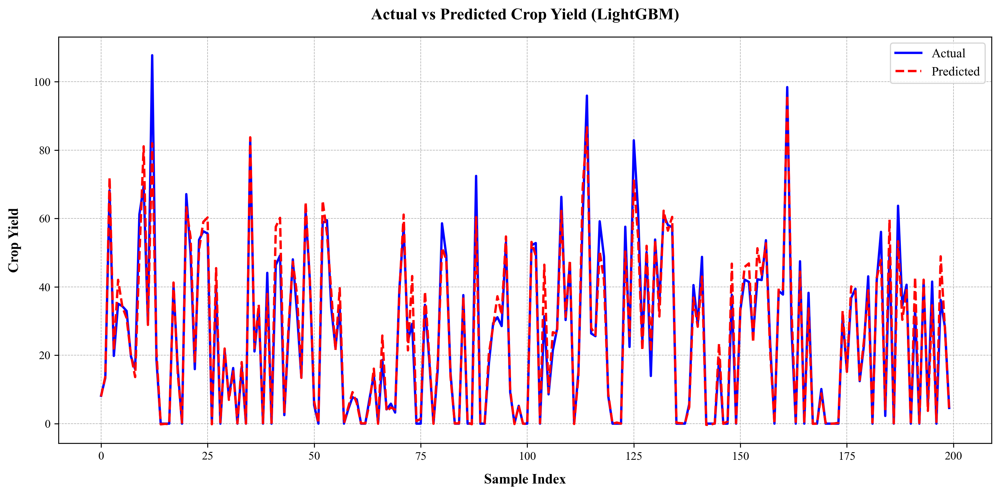

Residuals for Random Sample:
 count    200.000000
mean      -0.316253
std        4.505034
min      -15.104586
25%       -1.485404
50%       -0.104971
75%        0.837613
max       25.733578
Name: Residuals, dtype: float64


In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create DataFrame
results_df_lgb = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_lgb
})
results_df_lgb['Residuals'] = results_df_lgb['Actual'] - results_df_lgb['Predicted']

# Sample 200 points for plotting
results_df_lgb_sampled = results_df_lgb.sample(n=200, random_state=42).sort_index()

# IEEE-style plot settings
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Line plot
plt.figure(figsize=(12, 6))
plt.plot(results_df_lgb_sampled['Actual'].reset_index(drop=True),
         label='Actual', color='blue', linestyle='-', linewidth=2)
plt.plot(results_df_lgb_sampled['Predicted'].reset_index(drop=True),
         label='Predicted', color='red', linestyle='--', linewidth=2)

# Labels and title
plt.title('Actual vs Predicted Crop Yield (LightGBM)', pad=15)
plt.xlabel('Sample Index', labelpad=10)
plt.ylabel('Crop Yield', labelpad=10)
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend()

# Save and show
plt.tight_layout()
plt.savefig('T-7.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-7.pdf', bbox_inches='tight')
plt.show()

# Optional: Print residual summary
print("Residuals for Random Sample:\n", results_df_lgb_sampled['Residuals'].describe())

In [67]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import GridSearchCV

# Define parameter grid
ada_param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0],
    'loss': ['linear', 'square', 'exponential']
}

# Initialize AdaBoost
ada_model = AdaBoostRegressor(random_state=42)

# GridSearchCV with single-threading
ada_grid_search = GridSearchCV(
    estimator=ada_model,
    param_grid=ada_param_grid,
    cv=3,
    n_jobs=1,  # 🔧 fix for BrokenProcessPool
    scoring='neg_mean_squared_error',
    verbose=1
)

# Fit the model
ada_grid_search.fit(X_train_scaled, y_train)

# Extract best parameters and model
best_ada_params = ada_grid_search.best_params_
ada_best_model = ada_grid_search.best_estimator_

# Evaluate
y_val_pred_ada = ada_best_model.predict(X_val_scaled)
ada_val_metrics = evaluate_model(y_val, y_val_pred_ada, "AdaBoost (Validation Set)")

y_test_pred_ada = ada_best_model.predict(X_test_scaled)
ada_test_metrics = evaluate_model(y_test, y_test_pred_ada, "AdaBoost (Test Set)")

# Output results
print("Best AdaBoost Parameters:", best_ada_params)
print("\nValidation Set Metrics:", ada_val_metrics)
print("\nTest Set Metrics:", ada_test_metrics)

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Performance metrics for AdaBoost (Validation Set):
MAE: 10.7255
MSE: 176.1796
RMSE: 13.2733
R2 Score: 0.7367
Performance metrics for AdaBoost (Test Set):
MAE: 10.5840
MSE: 171.9392
RMSE: 13.1126
R2 Score: 0.7399
Best AdaBoost Parameters: {'learning_rate': 0.1, 'loss': 'linear', 'n_estimators': 100}

Validation Set Metrics: (10.725456647006338, 176.1796271967043, 13.273267389633357, 0.7367107694938068)

Test Set Metrics: (10.584042127711497, 171.93922128081974, 13.112559676921197, 0.7399181162135491)


In [68]:
print(f"Length of y_test: {len(y_test)}")
print(f"Length of y_test_pred: {len(y_test_pred_ada)}")
import pandas as pd
print(y_test.shape)
print(y_test_pred_ada.shape) 

Length of y_test: 5478
Length of y_test_pred: 5478
(5478,)
(5478,)


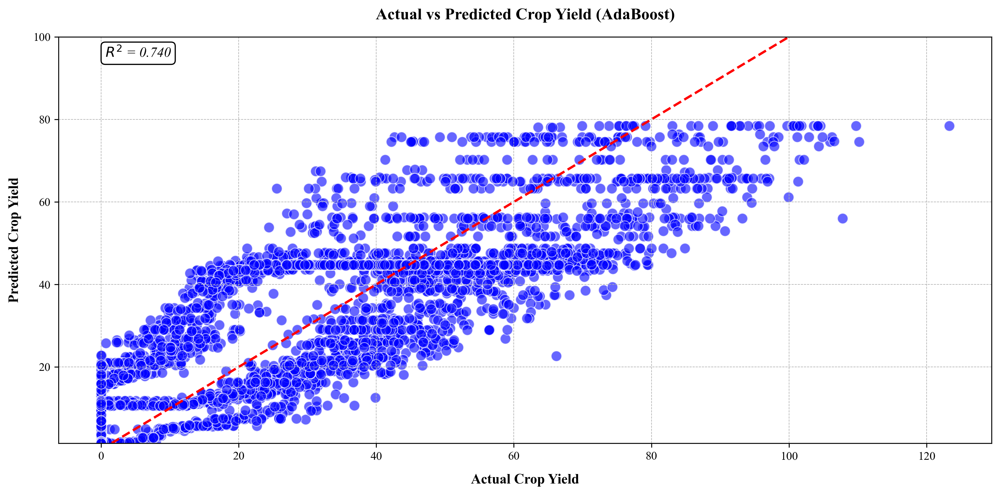

Residuals:
 count    5478.000000
mean       -1.242729
std        13.054729
min       -37.680920
25%       -10.779828
50%        -1.499188
75%         7.913355
max        51.775457
Name: Residuals, dtype: float64


In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import r2_score

# Create DataFrame
results_df_ada = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_ada
})
results_df_ada['Residuals'] = results_df_ada['Actual'] - results_df_ada['Predicted']
r2 = r2_score(results_df_ada['Actual'], results_df_ada['Predicted'])

# IEEE-style configuration
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Scatter plot
plt.figure(figsize=(12, 6))
sns.scatterplot(data=results_df_ada, x='Actual', y='Predicted',
                color='blue', alpha=0.6, s=80)

# 45-degree reference line
plt.plot([results_df_ada['Actual'].min(), results_df_ada['Actual'].max()],
         [results_df_ada['Actual'].min(), results_df_ada['Actual'].max()],
         color='red', linestyle='--', linewidth=2)

# Add R² annotation
plt.text(0.05, 0.95, f'$R^2$ = {r2:.3f}',
         transform=plt.gca().transAxes,
         fontsize=12,
         fontstyle='italic',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Labels and title
plt.title('Actual vs Predicted Crop Yield (AdaBoost)', pad=15)
plt.xlabel('Actual Crop Yield', labelpad=10)
plt.ylabel('Predicted Crop Yield', labelpad=10)

# Optional: Limit y-axis
plt.ylim(results_df_ada['Predicted'].min(), 100)

# Finalize
plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.savefig('T-8.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-8.pdf', bbox_inches='tight')
plt.show()

# Print residual summary
print("Residuals:\n", results_df_ada['Residuals'].describe())

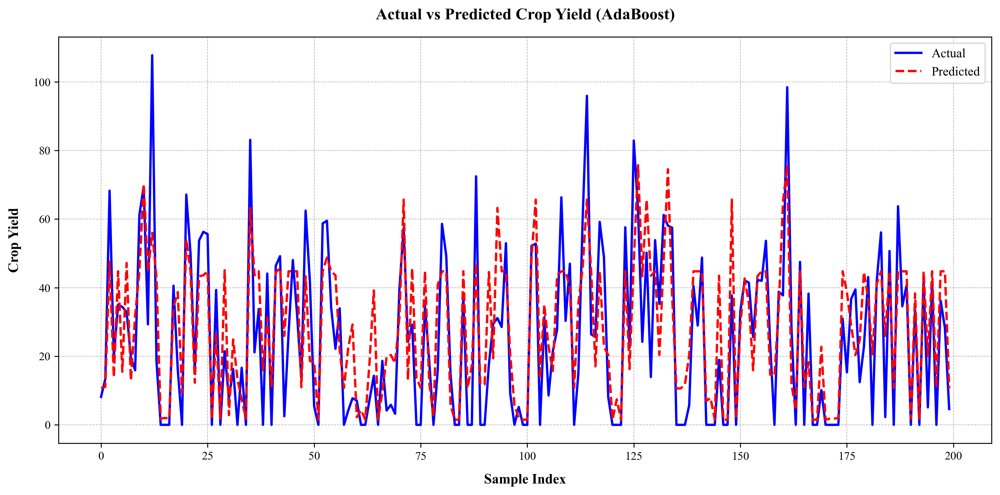

Residuals for Random Sample:
 count    200.000000
mean      -2.614026
std       13.725823
min      -32.107939
25%      -12.857119
50%       -1.799445
75%        6.339783
max       51.775457
Name: Residuals, dtype: float64


In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create DataFrame
results_df_ada = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_ada
})
results_df_ada['Residuals'] = results_df_ada['Actual'] - results_df_ada['Predicted']

# Take a consistent random sample
results_df_ada_sampled = results_df_ada.sample(n=200, random_state=42).sort_index()

# IEEE-compliant styling
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Line plot for actual vs predicted
plt.figure(figsize=(12, 6))
plt.plot(results_df_ada_sampled['Actual'].reset_index(drop=True), label='Actual',
         color='blue', linestyle='-', linewidth=2)
plt.plot(results_df_ada_sampled['Predicted'].reset_index(drop=True), label='Predicted',
         color='red', linestyle='--', linewidth=2)

# Title and labels
plt.title('Actual vs Predicted Crop Yield (AdaBoost)', pad=15)
plt.xlabel('Sample Index', labelpad=10)
plt.ylabel('Crop Yield', labelpad=10)
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend()

# Save high-resolution versions
plt.tight_layout()
plt.savefig('T-9.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-9.pdf', bbox_inches='tight')  # Optional vector version
plt.show()

# Print residual stats
print("Residuals for Random Sample:\n", results_df_ada_sampled['Residuals'].describe())

In [72]:
# Calculate absolute errors (no residuals column created)
results_df_ada['Absolute_Error'] = (results_df_ada['Actual'] - results_df_ada['Predicted']).abs()

# Sort by error and select top 10
top_10_errors = results_df_ada.sort_values(by='Absolute_Error', ascending=False).head(10)

# Display only relevant columns
print("Top 10 Highest Absolute Errors (AdaBoost):")
print(top_10_errors[['Actual', 'Predicted', 'Absolute_Error']])

Top 10 Highest Absolute Errors (AdaBoost):
           Actual  Predicted  Absolute_Error
1202   107.763666  55.988209       51.775457
35716  123.270744  78.442237       44.828507
2117    66.181097  22.625931       43.555166
4672    99.937563  61.126796       38.810766
33556   90.656658  52.972852       37.683805
13630   25.547313  63.228234       37.680920
35366   93.201349  55.988209       37.213140
4546   101.293272  64.951700       36.341572
19429   31.189555  67.419656       36.230101
21069   84.845641  48.754251       36.091391


In [74]:
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV

# Define parameter grid for CatBoost
cat_param_grid = {
    'iterations': [100, 200],
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Initialize CatBoost model
cat_model = CatBoostRegressor(verbose=0, random_state=42)

# GridSearchCV with n_jobs=1 to avoid multiprocessing errors
cat_grid_search = GridSearchCV(estimator=cat_model,
                                param_grid=cat_param_grid,
                                cv=3,
                                n_jobs=1,  # 🛠 Prevents pickling issues
                                scoring='neg_mean_squared_error')

# Fit the grid search
cat_grid_search.fit(X_train, y_train)

# Retrieve best model and parameters
best_cat_params = cat_grid_search.best_params_
cat_best_model = cat_grid_search.best_estimator_

# Evaluate on validation set
y_val_pred_cat = cat_best_model.predict(X_val)
cat_val_metrics = evaluate_model(y_val, y_val_pred_cat, "CatBoost (Validation Set)")

# Evaluate on test set
y_test_pred_cat = cat_best_model.predict(X_test)
cat_test_metrics = evaluate_model(y_test, y_test_pred_cat, "CatBoost (Test Set)")

# Print results
print("Best CatBoost Parameters:", best_cat_params)
print("\nValidation Set Metrics:", cat_val_metrics)
print("\nTest Set Metrics:", cat_test_metrics)

Performance metrics for CatBoost (Validation Set):
MAE: 2.4481
MSE: 14.9495
RMSE: 3.8665
R2 Score: 0.9777
Performance metrics for CatBoost (Test Set):
MAE: 2.4493
MSE: 14.9132
RMSE: 3.8618
R2 Score: 0.9774
Best CatBoost Parameters: {'depth': 8, 'iterations': 200, 'learning_rate': 0.1}

Validation Set Metrics: (2.448124125892964, 14.949478087133421, 3.8664554940065483, 0.9776589572548251)

Test Set Metrics: (2.4492652323490844, 14.913150941222595, 3.8617549043436967, 0.9774417939019855)


C:\Users\kanakaraju\AppData\Local\Temp\ipykernel_12648\3420172204.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


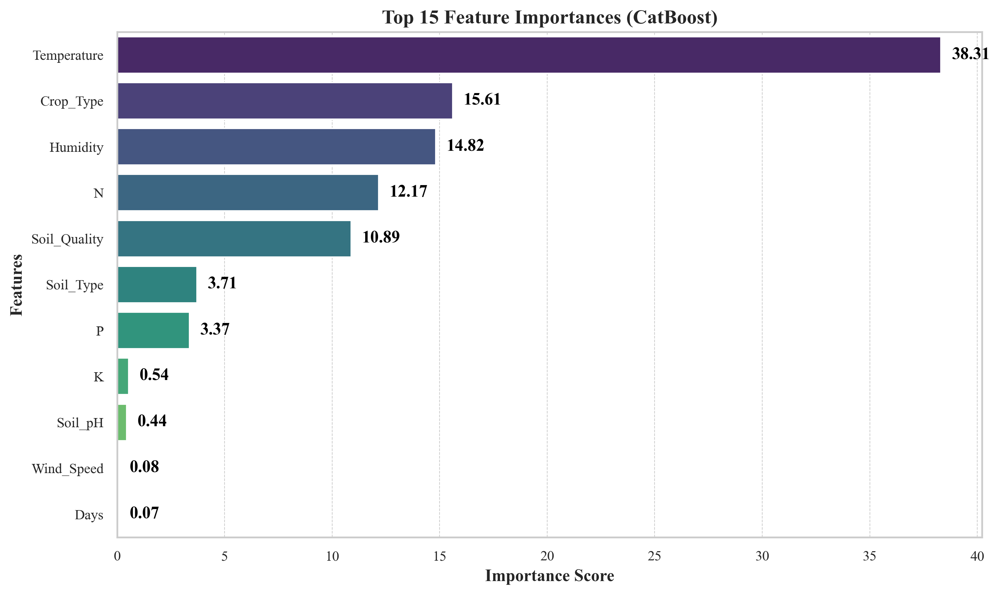

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Get feature importances from best CatBoost model
feature_importances = cat_best_model.get_feature_importance()
feature_names = X_train.columns

# Create a DataFrame and sort by importance
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot styling for IEEE
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Initialize figure
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=feature_importance_df.head(15),
    x='Importance',
    y='Feature',
    palette='viridis'
)

# Add importance values at the end of each bar
for i, (value, name) in enumerate(zip(
        feature_importance_df['Importance'].head(15),
        feature_importance_df['Feature'].head(15))):
    ax.text(value + 0.5, i, f'{value:.2f}', color='black', va='center', fontweight='bold')

# Plot labels
plt.title('Top 15 Feature Importances (CatBoost)', fontsize=14, fontweight='bold')
plt.xlabel('Importance Score', fontsize=12, fontweight='bold')
plt.ylabel('Features', fontsize=12, fontweight='bold')
plt.grid(True, axis='x', linestyle='--', linewidth=0.5)

# Save the figure
plt.tight_layout()
plt.savefig('T-13.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-13.pdf', bbox_inches='tight')
plt.show()

In [75]:
print(f"Length of y_test: {len(y_test)}")
print(f"Length of y_test_pred: {len(y_test_pred_cat)}")
import pandas as pd
print(y_test.shape)
print(y_test_pred_cat.shape) 

Length of y_test: 5478
Length of y_test_pred: 5478
(5478,)
(5478,)


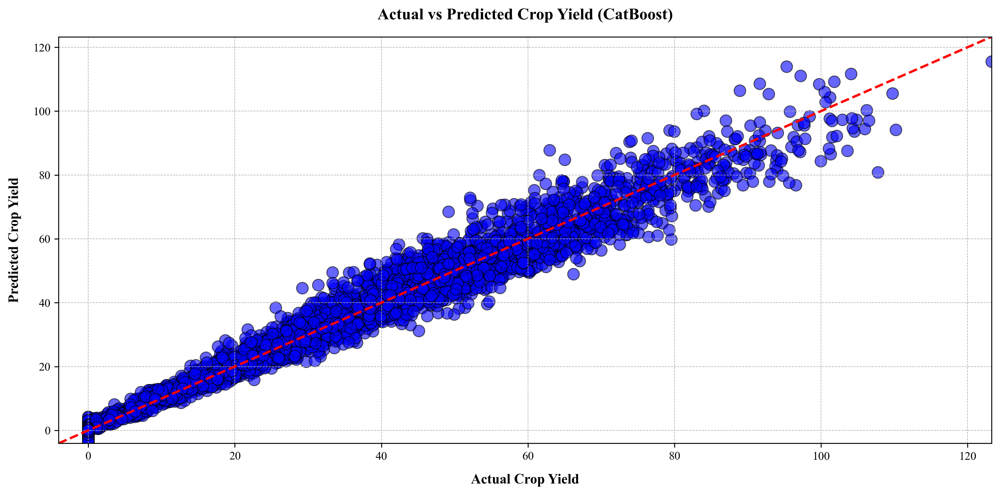

Absolute Error Summary:
 count    5478.000000
mean        2.449265
std         2.985947
min         0.001002
25%         0.419549
50%         1.261821
75%         3.426783
max        26.938206
Name: Absolute_Error, dtype: float64


In [76]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create DataFrame for plotting
results_df_cat = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_cat
})
results_df_cat['Absolute_Error'] = abs(results_df_cat['Actual'] - results_df_cat['Predicted'])

# Apply IEEE-compliant font and style
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Create the scatter plot
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=results_df_cat,
    x='Actual',
    y='Predicted',
    color='blue',
    alpha=0.6,
    s=100,
    edgecolor='black'
)

# Reference line (Ideal predictions)
min_val = min(results_df_cat['Actual'].min(), results_df_cat['Predicted'].min())
max_val = max(results_df_cat['Actual'].max(), results_df_cat['Predicted'].max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2)

# Labels and title
plt.title('Actual vs Predicted Crop Yield (CatBoost)', pad=15)
plt.xlabel('Actual Crop Yield', labelpad=10)
plt.ylabel('Predicted Crop Yield', labelpad=10)
plt.grid(True, linestyle='--', linewidth=0.5)

# Set axis limits for consistent scaling
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

# Save figure
plt.tight_layout()
plt.savefig('T-10.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-10.pdf', bbox_inches='tight')
plt.show()

# Optional: Print error summary
print("Absolute Error Summary:\n", results_df_cat['Absolute_Error'].describe())

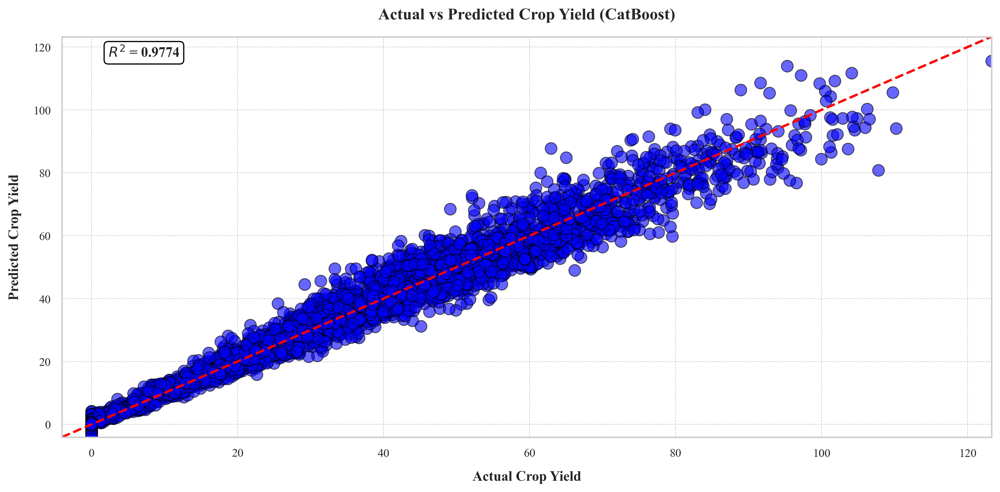

Absolute Error Summary:
 count    5478.000000
mean        2.449265
std         2.985947
min         0.001002
25%         0.419549
50%         1.261821
75%         3.426783
max        26.938206
Name: Absolute_Error, dtype: float64


In [84]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import r2_score

# Create DataFrame for plotting
results_df_cat = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_cat
})
results_df_cat['Absolute_Error'] = abs(results_df_cat['Actual'] - results_df_cat['Predicted'])

# Compute R² Score
r2 = r2_score(results_df_cat['Actual'], results_df_cat['Predicted'])

# Apply IEEE-compliant font and style
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Create the scatter plot
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=results_df_cat,
    x='Actual',
    y='Predicted',
    color='blue',
    alpha=0.6,
    s=100,
    edgecolor='black'
)

# Reference line (Ideal predictions)
min_val = min(results_df_cat['Actual'].min(), results_df_cat['Predicted'].min())
max_val = max(results_df_cat['Actual'].max(), results_df_cat['Predicted'].max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2)

# R² annotation
plt.text(min_val + 0.05 * (max_val - min_val),
         max_val - 0.05 * (max_val - min_val),
         f"$R^2$ = {r2:.4f}",
         fontsize=12,
         fontweight='bold',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Labels and title
plt.title('Actual vs Predicted Crop Yield (CatBoost)', pad=15)
plt.xlabel('Actual Crop Yield', labelpad=10)
plt.ylabel('Predicted Crop Yield', labelpad=10)
plt.grid(True, linestyle='--', linewidth=0.5)

# Set axis limits
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

# Save figure
plt.tight_layout()
plt.savefig('T-10.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-10.pdf', bbox_inches='tight')
plt.show()

# Optional: Print error summary
print("Absolute Error Summary:\n", results_df_cat['Absolute_Error'].describe())

In [77]:
import pandas as pd

# Create DataFrame
results_df_cat = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_cat
})

# Calculate absolute error inline and sort
top10_errors = results_df_cat.copy()
top10_errors['Absolute_Error'] = (top10_errors['Actual'] - top10_errors['Predicted']).abs()
top10_errors = top10_errors.sort_values(by='Absolute_Error', ascending=False).head(10)

# Drop the error column before displaying, if you don't want to show it
top10_errors_display = top10_errors[['Actual', 'Predicted']]  # Only show these two columns

# Print results
print("Top 10 Highest Absolute Errors (CatBoost):")
print(top10_errors_display)

Top 10 Highest Absolute Errors (CatBoost):
           Actual   Predicted
1202   107.763666   80.825460
15956   62.943780   87.794373
5720    52.080161   72.847596
14159   52.122930   72.036602
17703   64.995867   84.793071
24419   96.540598   76.769166
926     79.553105   59.789990
29676   49.140951   68.502167
34046   95.276324  113.957336
6341    61.518732   79.982434


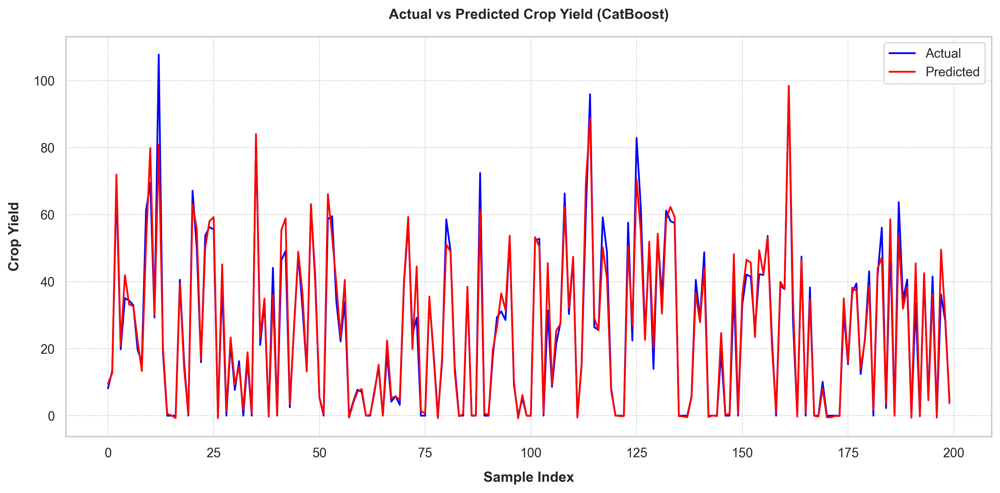

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create a DataFrame
results_df_cat = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred_cat
})

# Take a random sample of 200 data points
results_df_cat_sampled = results_df_cat.sample(n=200, random_state=42).sort_index()

# Apply IEEE-compliant font and styling
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Set the style of seaborn
sns.set(style='whitegrid')

# Create the line plot
plt.figure(figsize=(12, 6))
plt.plot(results_df_cat_sampled['Actual'].reset_index(drop=True), label='Actual', color='blue', linestyle='-', linewidth=1.5)
plt.plot(results_df_cat_sampled['Predicted'].reset_index(drop=True), label='Predicted', color='red', linestyle='-', linewidth=1.5)

# Add labels and title
plt.title('Actual vs Predicted Crop Yield (CatBoost)', pad=15)
plt.xlabel('Sample Index', labelpad=10)
plt.ylabel('Crop Yield', labelpad=10)
plt.legend()
plt.grid(True, linestyle='--', linewidth=0.5)

# Save the plot
plt.tight_layout()
plt.savefig('T-11.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-11.pdf', bbox_inches='tight')
plt.show()

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Get feature importances from CatBoost model
feature_importances = model_cat.get_feature_importance()
feature_names = X_train.columns

# Create DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# IEEE-compliant style
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 11
})

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance_df.head(15), x='Importance', y='Feature', palette='viridis')
plt.title('Top 15 Feature Importances (CatBoost)', fontsize=14, fontweight='bold')
plt.xlabel('Importance Score', fontsize=12, fontweight='bold')
plt.ylabel('Features', fontsize=12, fontweight='bold')
plt.grid(True, linestyle='--', linewidth=0.5, axis='x')
plt.tight_layout()

# Save
plt.savefig('catboost_feature_importance.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('catboost_feature_importance.pdf', bbox_inches='tight')
plt.show()

NameError: name 'model_cat' is not defined

In [80]:
print(results_df_cat.shape)
print(results_df_cat.head())

(5478, 2)
          Actual  Predicted
12286  39.875906  39.798850
13020   0.000000  -0.147809
23511  13.984557  12.040350
25415  38.855743  41.339308
3570    0.000000   0.489014


In [81]:
print("RF Columns:", results_df_rf.columns)
print("XGB Columns:", results_df_xgb.columns)
print("LGB Columns:", results_df_lgb.columns)
print("ADA Columns:", results_df_ada.columns)
print("CAT Columns:", results_df_cat.columns)

RF Columns: Index(['Actual', 'Predicted', 'Residuals'], dtype='object')
XGB Columns: Index(['Actual', 'Predicted', 'Residuals', 'Absolute_Error'], dtype='object')
LGB Columns: Index(['Actual', 'Predicted', 'Residuals', 'Absolute_Error'], dtype='object')
ADA Columns: Index(['Actual', 'Predicted', 'Residuals', 'Absolute_Error'], dtype='object')
CAT Columns: Index(['Actual', 'Predicted'], dtype='object')


In [82]:
import numpy as np
import pandas as pd
from scipy.stats import friedmanchisquare
import scikit_posthocs as sp

# Assuming these DataFrames already exist and are structured as follows:
# results_df_rf, results_df_xgb, results_df_lgb, results_df_ada, results_df_cat

# Extract the actual and predicted values from each DataFrame
y_test_rf = results_df_rf['Actual']
preds_rf = results_df_rf['Predicted']

y_test_xgb = results_df_xgb['Actual']
preds_xgb = results_df_xgb['Predicted']

y_test_lgb = results_df_lgb['Actual']
preds_lgb = results_df_lgb['Predicted']

y_test_ada = results_df_ada['Actual']
preds_ada = results_df_ada['Predicted']

y_test_cat = results_df_cat['Actual']
preds_cat = results_df_cat['Predicted']

# Conduct the Friedman test on the predictions
stat, p_value = friedmanchisquare(preds_rf, preds_xgb, preds_lgb, preds_ada, preds_cat)

print(f'Friedman statistic: {stat}, p-value: {p_value}')

# Check for significant differences
if p_value < 0.05:
    print("There are significant differences between the models.")
else:
    print("No significant differences between the models.")

# Post-hoc analysis using Nemenyi test if the Friedman test is significant
if p_value < 0.05:
    # Create a DataFrame for post-hoc analysis
    data = pd.DataFrame({
        'Random Forest': preds_rf,
        'XGBoost': preds_xgb,
        'LightGBM': preds_lgb,
        'AdaBoost': preds_ada,
        'CatBoost': preds_cat,
    })

    # Reshape data for post-hoc analysis
    melted_data = data.melt(var_name='Model', value_name='Score')

    # Perform Nemenyi test
    posthoc_result = sp.posthoc_nemenyi(melted_data, val_col='Score', group_col='Model')
    print("\nPost-hoc Nemenyi test results:")
    print(posthoc_result)


Friedman statistic: 437.9576487769227, p-value: 1.7421509865445504e-93
There are significant differences between the models.

Post-hoc Nemenyi test results:
                   AdaBoost      CatBoost      LightGBM  Random Forest  \
AdaBoost       1.000000e+00  2.200087e-23  2.706159e-23   1.487723e-26   
CatBoost       2.200087e-23  1.000000e+00  1.000000e+00   9.772844e-01   
LightGBM       2.706159e-23  1.000000e+00  1.000000e+00   9.747267e-01   
Random Forest  1.487723e-26  9.772844e-01  9.747267e-01   1.000000e+00   
XGBoost        1.248918e-22  9.999013e-01  9.999402e-01   9.493319e-01   

                    XGBoost  
AdaBoost       1.248918e-22  
CatBoost       9.999013e-01  
LightGBM       9.999402e-01  
Random Forest  9.493319e-01  
XGBoost        1.000000e+00  


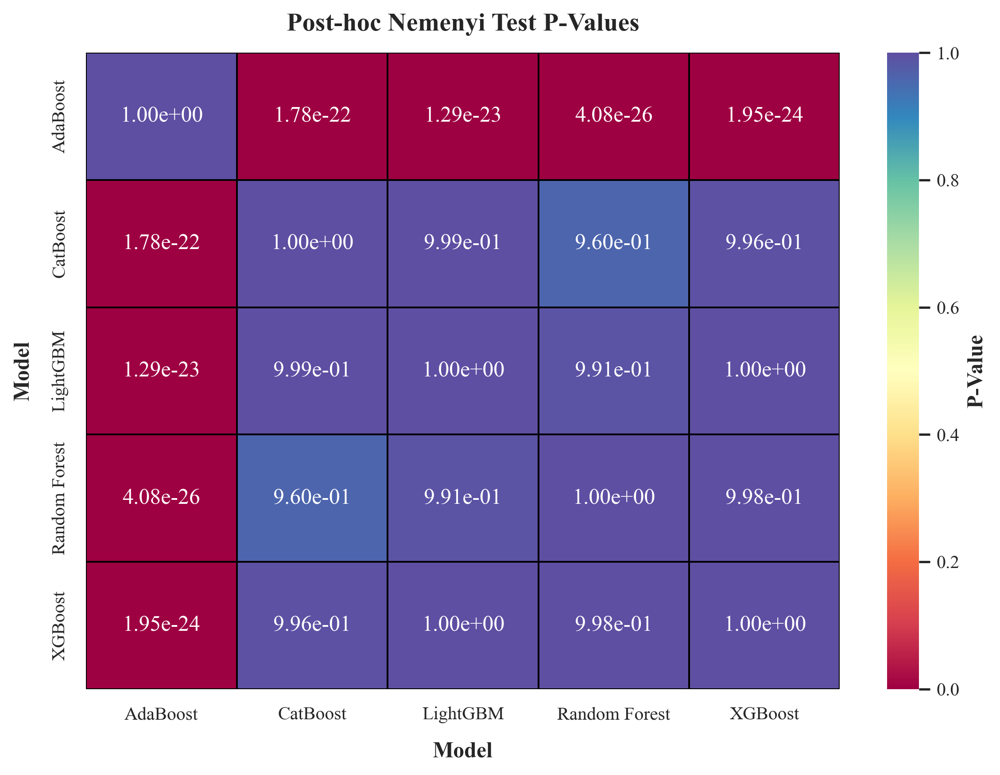

In [83]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# P-value matrix from Nemenyi test
p_values = np.array([
    [1.0, 1.775497e-22, 1.288637e-23, 4.078282e-26, 1.953887e-24],
    [1.775497e-22, 1.0, 9.994935e-01, 9.604508e-01, 9.958984e-01],
    [1.288637e-23, 9.994935e-01, 1.0, 9.906340e-01, 9.998741e-01],
    [4.078282e-26, 9.604508e-01, 9.906340e-01, 1.0, 9.980502e-01],
    [1.953887e-24, 9.958984e-01, 9.998741e-01, 9.980502e-01, 1.0]
])

models = ['AdaBoost', 'CatBoost', 'LightGBM', 'Random Forest', 'XGBoost']
p_value_df = pd.DataFrame(p_values, index=models, columns=models)

# Apply IEEE-compliant font style
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10
})

# Create heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(p_value_df, annot=True, fmt=".2e", cmap='Spectral', center=0.5,
            linewidths=0.5, linecolor='black', cbar_kws={'label': 'P-Value'})

# Title and labels
plt.title('Post-hoc Nemenyi Test P-Values', pad=12)
plt.xlabel('Model', labelpad=10)
plt.ylabel('Model', labelpad=10)

# Save figure
plt.tight_layout()
plt.savefig('T-12.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('T-12.pdf', bbox_inches='tight')
plt.show()